# 🌤️ Prediksi Suhu Multi-Kota Jawa — Enhanced v3
## Multi-Station Independent | LSTM · GRU · Transformer Weighted Ensemble

| Item | Detail |
|------|--------|
| **Dataset** | NASA POWER (2000–2026), 6 kota Pulau Jawa |
| **Target** | Prediksi suhu harian (°C) |
| **Arsitektur** | BigLSTM · BigGRU · Transformer → Weighted Ensemble |
| **v3 Enhancement** | EDA Lengkap + Training per Kota Terpisah + Visualisasi dari `.pt` |

---
### 📋 Alur Cell
```
[Cell 1]  Install & Import
[Cell 2]  Konfigurasi
[Cell 3]  Download NASA POWER → simpan CSV per kota
[Cell 4]  Load CSV per kota
[Cell 5]  EDA — Time Series & Statistik Deskriptif
[Cell 5B] EDA — Korelasi & Distribusi Fitur
[Cell 5C] EDA — Missing Value, Outlier & Tren
[Cell 6]  Definisi Model & Fungsi Training
[Cell 7]  Training — JAKARTA
[Cell 8]  Training — BANDUNG
[Cell 9]  Training — SEMARANG
[Cell 10] Training — YOGYAKARTA
[Cell 11] Training — SURABAYA
[Cell 12] Training — MALANG
[Cell 13] Ringkasan Tabel Metrik
[Cell 14] Visualisasi Hasil (dari .pt + train/test data)
[Cell 15] Ringkasan Total Pengujian
[Cell R]  Recovery — Load ulang dari checkpoint
```


## Cell 1 — Install & Import Library

In [1]:
!pip install torch scikit-learn pandas numpy matplotlib seaborn requests --quiet

import os, math, random, requests, warnings, json, glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.gridspec as gridspec
import matplotlib.ticker as mticker
import seaborn as sns
from pathlib import Path
from scipy import stats
from scipy.stats import gaussian_kde

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

warnings.filterwarnings('ignore')
pd.set_option('display.float_format', '{:.4f}'.format)
plt.rcParams.update({
    'figure.dpi'      : 120,
    'axes.spines.top' : False,
    'axes.spines.right': False,
    'font.size'       : 9,
})

SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark     = False

DEVICE  = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
CSV_DIR = Path('data_kota')
CSV_DIR.mkdir(exist_ok=True)

print(f'PyTorch : {torch.__version__}')
print(f'Device  : {DEVICE}')
print(f'CSV Dir : {CSV_DIR.resolve()}')
print('✅ Library siap')


PyTorch : 2.2.2
Device  : cpu
CSV Dir : /Users/miftahul/Jupyter/climate_we/data_kota
✅ Library siap


## Cell 2 — Konfigurasi Kota & Hyperparameter

In [2]:
CITIES = {
    'Jakarta'   : {'lat': -6.2088,  'lon': 106.8456, 'elev':   8.0, 'zone': 'pesisir_utara'},
    'Bandung'   : {'lat': -6.9175,  'lon': 107.6191, 'elev': 768.0, 'zone': 'dataran_tinggi'},
    'Semarang'  : {'lat': -6.9932,  'lon': 110.4203, 'elev':   5.0, 'zone': 'pesisir_utara'},
    'Yogyakarta': {'lat': -7.7956,  'lon': 110.3695, 'elev': 114.0, 'zone': 'dataran_tengah'},
    'Surabaya'  : {'lat': -7.2575,  'lon': 112.7521, 'elev':   6.0, 'zone': 'pesisir_utara'},
    'Malang'    : {'lat': -7.9797,  'lon': 112.6304, 'elev': 445.0, 'zone': 'dataran_tinggi'},
}

WINDOW        = 14
BATCH_SIZE    = 64
EPOCHS        = 500
PATIENCE      = 80
LR            = 3e-4

SPLIT_CONFIGS = [
    (0.90, 0.10, '90/10', 'Agresif — banyak train, sedikit test'),
    (0.80, 0.20, '80/20', 'Standar — paling umum dipakai'),
    (0.70, 0.30, '70/30', 'Konservatif — test lebih representatif'),
    (0.60, 0.40, '60/40', 'Banyak test — cocok untuk validasi jangka panjang'),
    (0.50, 0.50, '50/50', 'Eksplorasi saja — tidak direkomendasikan time series'),
]

BASE_FEATURES = [
    'TEMPERATURE','PRECIPITATION','HUMIDITY','WIND_SPEED',
    'month_sin','month_cos','day_sin','day_cos',
    'TEMP_LAG1','TEMP_LAG3','TEMP_LAG7','TEMP_ROLL7'
]

CITY_COLORS = {
    'Jakarta':'#e41a1c','Bandung':'#377eb8','Semarang':'#4daf4a',
    'Yogyakarta':'#984ea3','Surabaya':'#ff7f00','Malang':'#a65628'
}
CMAP_SPLIT = {
    '90/10':'#1f77b4','80/20':'#2ca02c','70/30':'#ff7f0e',
    '60/40':'#9467bd','50/50':'#aaaaaa',
}

# Storage global hasil training
all_results = {city: {} for city in CITIES}

print(f'Kota          : {list(CITIES.keys())}')
print(f'Fitur input   : {len(BASE_FEATURES)}')
print(f'Window        : {WINDOW} | Batch: {BATCH_SIZE} | Epochs: {EPOCHS} | Patience: {PATIENCE}')
print('Splits yang diuji:')
for tr, te, lbl, note in SPLIT_CONFIGS:
    print(f'  [{lbl}] {note}')
print('✅ Konfigurasi siap')


Kota          : ['Jakarta', 'Bandung', 'Semarang', 'Yogyakarta', 'Surabaya', 'Malang']
Fitur input   : 12
Window        : 14 | Batch: 64 | Epochs: 500 | Patience: 80
Splits yang diuji:
  [90/10] Agresif — banyak train, sedikit test
  [80/20] Standar — paling umum dipakai
  [70/30] Konservatif — test lebih representatif
  [60/40] Banyak test — cocok untuk validasi jangka panjang
  [50/50] Eksplorasi saja — tidak direkomendasikan time series
✅ Konfigurasi siap


## Cell 3 — Download NASA POWER → Simpan CSV per Kota

In [3]:
NASA_START = '20000101'
NASA_END   = '20260523'

def download_nasa_raw(city_name, meta, start=NASA_START, end=NASA_END):
    print(f'  ⬇️  {city_name}: menghubungi NASA POWER API...')
    url = 'https://power.larc.nasa.gov/api/temporal/daily/point'
    params = dict(
        start=start, end=end,
        latitude=str(meta['lat']), longitude=str(meta['lon']),
        community='ag', parameters='T2M,PRECTOTCORR,RH2M,WS10M',
        format='csv', header='true', **{'time-standard': 'utc'},
    )
    try:
        r = requests.get(url, params=params, timeout=180)
        if r.status_code != 200:
            print(f'  ❌ HTTP {r.status_code}'); return None
        c = r.content
        if b'Error' in c[:500] or b'<html' in c[:500].lower():
            print(f'  ❌ Respons bukan CSV'); return None
        return c
    except Exception as e:
        print(f'  ❌ Error: {e}'); return None

def parse_and_save_csv(city_name, meta, raw_bytes):
    import io
    try:
        df = pd.read_csv(io.BytesIO(raw_bytes), skiprows=14)
        df.columns = ['YEAR','DOY','TEMPERATURE','PRECIPITATION','HUMIDITY','WIND_SPEED']
        df = df.replace(-999, np.nan)
        df['DATE'] = pd.to_datetime(
            df['YEAR'].astype(int).astype(str) + ' ' +
            df['DOY'].astype(int).astype(str), format='%Y %j')
        for c in ['TEMPERATURE','PRECIPITATION','HUMIDITY','WIND_SPEED']:
            df[c] = df[c].interpolate(method='linear', limit_direction='both')
        df = df.dropna(subset=['TEMPERATURE','PRECIPITATION','HUMIDITY','WIND_SPEED'])
        df = df[['DATE','TEMPERATURE','PRECIPITATION','HUMIDITY','WIND_SPEED']].copy()
        df['month_sin'] = np.sin(2*np.pi*df['DATE'].dt.month/12)
        df['month_cos'] = np.cos(2*np.pi*df['DATE'].dt.month/12)
        df['day_sin']   = np.sin(2*np.pi*df['DATE'].dt.dayofyear/365.25)
        df['day_cos']   = np.cos(2*np.pi*df['DATE'].dt.dayofyear/365.25)
        df['TEMP_LAG1']  = df['TEMPERATURE'].shift(1)
        df['TEMP_LAG3']  = df['TEMPERATURE'].shift(3)
        df['TEMP_LAG7']  = df['TEMPERATURE'].shift(7)
        df['TEMP_ROLL7'] = df['TEMPERATURE'].rolling(7).mean()
        df['lat_norm']   = meta['lat']  / 90.0
        df['lon_norm']   = meta['lon']  / 180.0
        df['elev_norm']  = meta['elev'] / 3000.0
        df = df.dropna().reset_index(drop=True)
        out = CSV_DIR / f'{city_name.lower()}.csv'
        df.to_csv(out, index=False)
        print(f'  💾 {city_name}: {len(df):,} baris → {out}')
        return out
    except Exception as e:
        print(f'  ❌ Parse error: {e}'); return None

print('='*65); print('  DOWNLOAD & SIMPAN CSV'); print('='*65)
city_csv_paths = {}
for city_name, meta in CITIES.items():
    out = CSV_DIR / f'{city_name.lower()}.csv'
    if out.exists():
        print(f'  ✅ {city_name}: CSV sudah ada (skip)')
        city_csv_paths[city_name] = out; continue
    raw = download_nasa_raw(city_name, meta)
    if raw:
        p = parse_and_save_csv(city_name, meta, raw)
        if p: city_csv_paths[city_name] = p
print(f'\n✅ CSV tersedia: {list(city_csv_paths.keys())}')


  DOWNLOAD & SIMPAN CSV
  ✅ Jakarta: CSV sudah ada (skip)
  ✅ Bandung: CSV sudah ada (skip)
  ✅ Semarang: CSV sudah ada (skip)
  ✅ Yogyakarta: CSV sudah ada (skip)
  ✅ Surabaya: CSV sudah ada (skip)
  ✅ Malang: CSV sudah ada (skip)

✅ CSV tersedia: ['Jakarta', 'Bandung', 'Semarang', 'Yogyakarta', 'Surabaya', 'Malang']


## Cell 4 — Load CSV per Kota

In [4]:
def load_city_csv(city_name):
    path = CSV_DIR / f'{city_name.lower()}.csv'
    if not path.exists():
        print(f'  ❌ {city_name}: tidak ditemukan'); return None
    df = pd.read_csv(path, parse_dates=['DATE'])
    if len(df) < 500:
        print(f'  ⚠️  {city_name}: terlalu sedikit ({len(df)})'); return None
    print(f'  ✅ {city_name}: {len(df):,} baris | '
          f'{df["DATE"].min().date()} → {df["DATE"].max().date()} | '
          f'avg {df["TEMPERATURE"].mean():.2f}°C')
    return df

print('='*65); print('  LOAD CSV'); print('='*65)
city_dataframes = {}
for city_name in city_csv_paths:
    df = load_city_csv(city_name)
    if df is not None:
        city_dataframes[city_name] = df
print(f'\n✅ {len(city_dataframes)} kota siap.')


  LOAD CSV
  ✅ Jakarta: 9,630 baris | 2000-01-10 → 2026-05-22 | avg 27.38°C
  ✅ Bandung: 9,630 baris | 2000-01-10 → 2026-05-22 | avg 21.50°C
  ✅ Semarang: 9,630 baris | 2000-01-10 → 2026-05-22 | avg 26.84°C
  ✅ Yogyakarta: 9,630 baris | 2000-01-10 → 2026-05-22 | avg 25.89°C
  ✅ Surabaya: 9,630 baris | 2000-01-10 → 2026-05-22 | avg 26.55°C
  ✅ Malang: 9,630 baris | 2000-01-10 → 2026-05-22 | avg 24.56°C

✅ 6 kota siap.


## Cell 5 — EDA: Statistik Deskriptif & Time Series

> EDA dilakukan **sebelum modeling** untuk memahami karakteristik data,
> mendeteksi anomali, dan menjustifikasi pilihan fitur.

  EDA 1 — STATISTIK DESKRIPTIF

  Kota           Elev Zone                  Mean°C    Std    Min  Median    Max    Skew
  --------------------------------------------------------------------------------
  Jakarta          8m pesisir_utara         27.383  0.757  24.98  27.360  30.05  0.1497
  Bandung        768m dataran_tinggi        21.502  0.948  16.79  21.550  24.33 -0.3279
  Semarang         5m pesisir_utara         26.837  1.228  23.11  26.620  31.84  0.9553
  Yogyakarta     114m dataran_tengah        25.893  0.963  21.95  25.950  29.30 -0.3562
  Surabaya         6m pesisir_utara         26.546  1.617  22.05  26.180  32.22  0.9342
  Malang         445m dataran_tinggi        24.564  1.297  19.77  24.430  29.21  0.5063


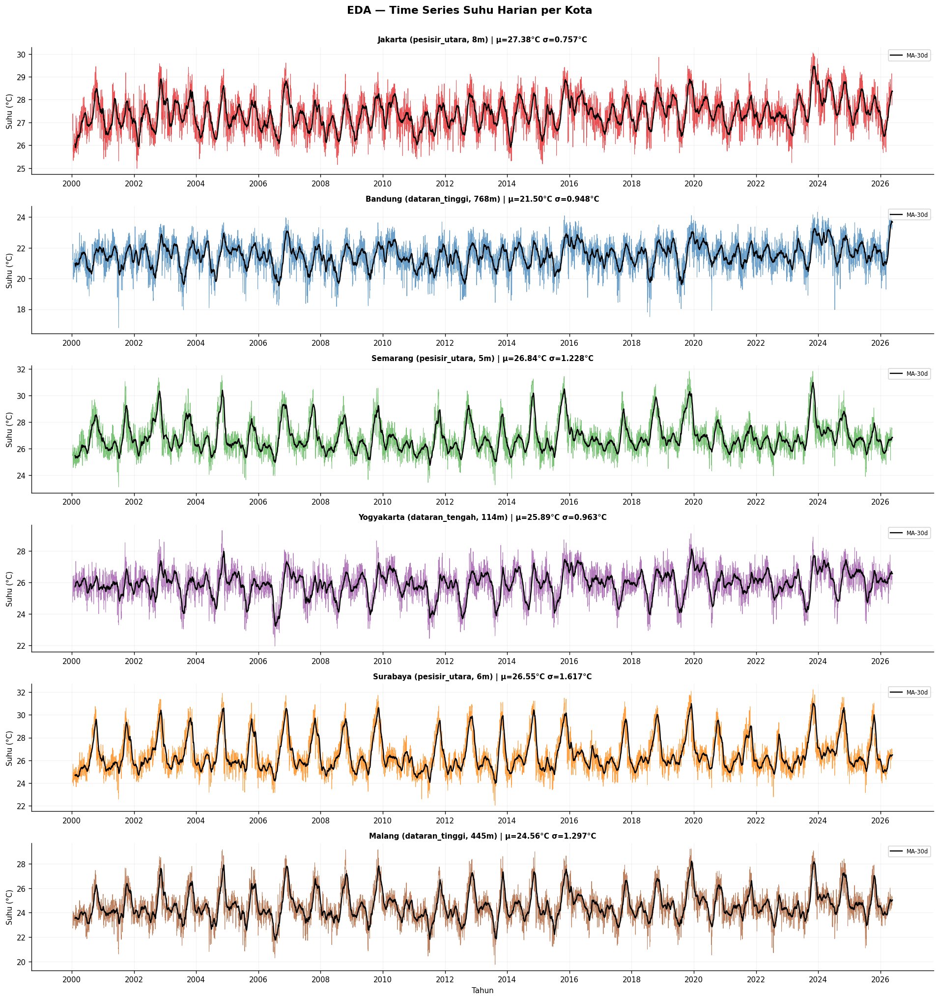

✅ eda_01_timeseries.png


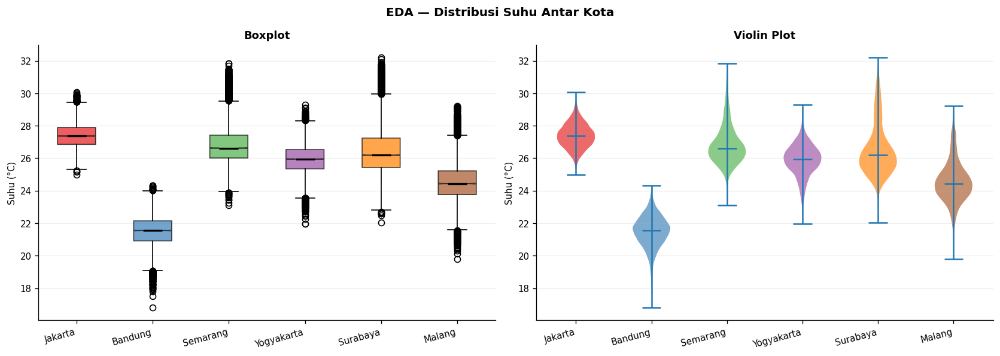

✅ eda_02_boxplot_violin.png


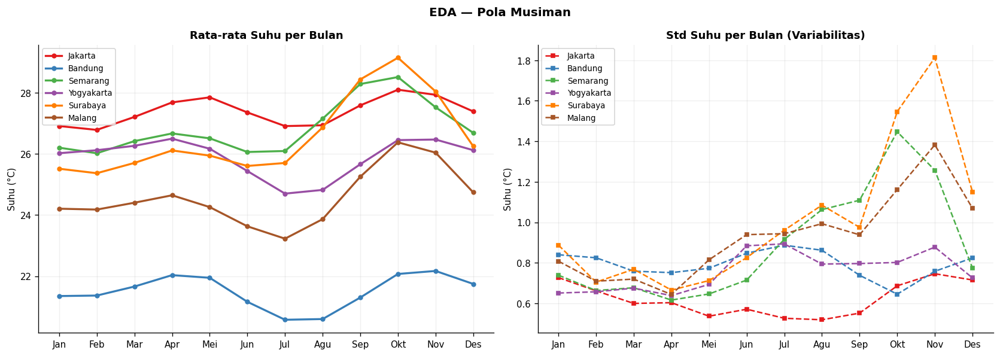

✅ eda_03_musiman.png

✅ EDA Bagian 1 selesai


In [6]:
print('='*70); print('  EDA 1 — STATISTIK DESKRIPTIF'); print('='*70)

# Tabel ringkasan per kota
print(f'\n  {"Kota":<12} {"Elev":>6} {"Zone":<20} {"Mean°C":>7} {"Std":>6} '
      f'{"Min":>6} {"Median":>7} {"Max":>6} {"Skew":>7}')
print('  ' + '-'*80)
for city_name, df in city_dataframes.items():
    t = df['TEMPERATURE']
    print(f'  {city_name:<12} {CITIES[city_name]["elev"]:>5.0f}m '
          f'{CITIES[city_name]["zone"]:<20} {t.mean():>7.3f} {t.std():>6.3f} '
          f'{t.min():>6.2f} {t.median():>7.3f} {t.max():>6.2f} '
          f'{stats.skew(t):>7.4f}')

# ── Plot 1: Time Series semua kota ──
n = len(city_dataframes)
fig, axes = plt.subplots(n, 1, figsize=(16, 2.8*n))
if n == 1: axes = [axes]
for ax, (city_name, df) in zip(axes, city_dataframes.items()):
    clr = CITY_COLORS.get(city_name, '#333')
    ax.plot(df['DATE'], df['TEMPERATURE'], color=clr, lw=0.55, alpha=0.75)
    ax.plot(df['DATE'], df['TEMPERATURE'].rolling(30).mean(),
            'k-', lw=1.4, label='MA-30d')
    meta = CITIES[city_name]
    ax.set_title(f'{city_name} ({meta["zone"]}, {meta["elev"]:.0f}m) | '
                 f'μ={df["TEMPERATURE"].mean():.2f}°C σ={df["TEMPERATURE"].std():.3f}°C',
                 fontsize=9, fontweight='bold')
    ax.set_ylabel('Suhu (°C)'); ax.legend(fontsize=7, loc='upper right')
    ax.grid(True, alpha=0.15)
    ax.xaxis.set_major_locator(mdates.YearLocator(2))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
axes[-1].set_xlabel('Tahun')
plt.suptitle('EDA — Time Series Suhu Harian per Kota', fontsize=13, fontweight='bold', y=1.005)
plt.tight_layout(); plt.savefig('eda_01_timeseries.png', dpi=150, bbox_inches='tight'); plt.show()
print('✅ eda_01_timeseries.png')

# ── Plot 2: Boxplot + Violin ──
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
data_box  = [df['TEMPERATURE'].values for df in city_dataframes.values()]
city_labs = list(city_dataframes.keys())
bp = axes[0].boxplot(data_box, patch_artist=True, notch=True,
                     medianprops=dict(color='black', lw=2))
for patch, c in zip(bp['boxes'], city_labs):
    patch.set_facecolor(CITY_COLORS.get(c,'#aaa')); patch.set_alpha(0.7)
axes[0].set_xticklabels(city_labs, rotation=15, ha='right')
axes[0].set_ylabel('Suhu (°C)'); axes[0].set_title('Boxplot', fontweight='bold')
axes[0].grid(True, axis='y', alpha=0.2)
parts = axes[1].violinplot(data_box, positions=range(1, len(city_labs)+1),
                            showmedians=True)
for pc, c in zip(parts['bodies'], city_labs):
    pc.set_facecolor(CITY_COLORS.get(c,'#aaa')); pc.set_alpha(0.65)
axes[1].set_xticks(range(1, len(city_labs)+1)); axes[1].set_xticklabels(city_labs, rotation=15, ha='right')
axes[1].set_ylabel('Suhu (°C)'); axes[1].set_title('Violin Plot', fontweight='bold')
axes[1].grid(True, axis='y', alpha=0.2)
plt.suptitle('EDA — Distribusi Suhu Antar Kota', fontsize=12, fontweight='bold')
plt.tight_layout(); plt.savefig('eda_02_boxplot_violin.png', dpi=150, bbox_inches='tight'); plt.show()
print('✅ eda_02_boxplot_violin.png')

# ── Plot 3: Pola Musiman Bulanan ──
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
month_labels = ['Jan','Feb','Mar','Apr','Mei','Jun','Jul','Agu','Sep','Okt','Nov','Des']
for city_name, df in city_dataframes.items():
    clr = CITY_COLORS.get(city_name,'#333')
    axes[0].plot(df.groupby(df['DATE'].dt.month)['TEMPERATURE'].mean().values,
                 marker='o', lw=2, ms=4, color=clr, label=city_name)
    axes[1].plot(df.groupby(df['DATE'].dt.month)['TEMPERATURE'].std().values,
                 marker='s', lw=1.5, ms=4, ls='--', color=clr, label=city_name)
for ax, title in zip(axes, ['Rata-rata Suhu per Bulan','Std Suhu per Bulan (Variabilitas)']):
    ax.set_xticks(range(12)); ax.set_xticklabels(month_labels)
    ax.set_ylabel('Suhu (°C)'); ax.set_title(title, fontweight='bold')
    ax.legend(fontsize=8); ax.grid(True, alpha=0.2)
plt.suptitle('EDA — Pola Musiman', fontsize=12, fontweight='bold')
plt.tight_layout(); plt.savefig('eda_03_musiman.png', dpi=150, bbox_inches='tight'); plt.show()
print('✅ eda_03_musiman.png')
print('\n✅ EDA Bagian 1 selesai')


## Cell 5B — EDA: Korelasi & Distribusi Fitur

  EDA 2 — KORELASI & DISTRIBUSI


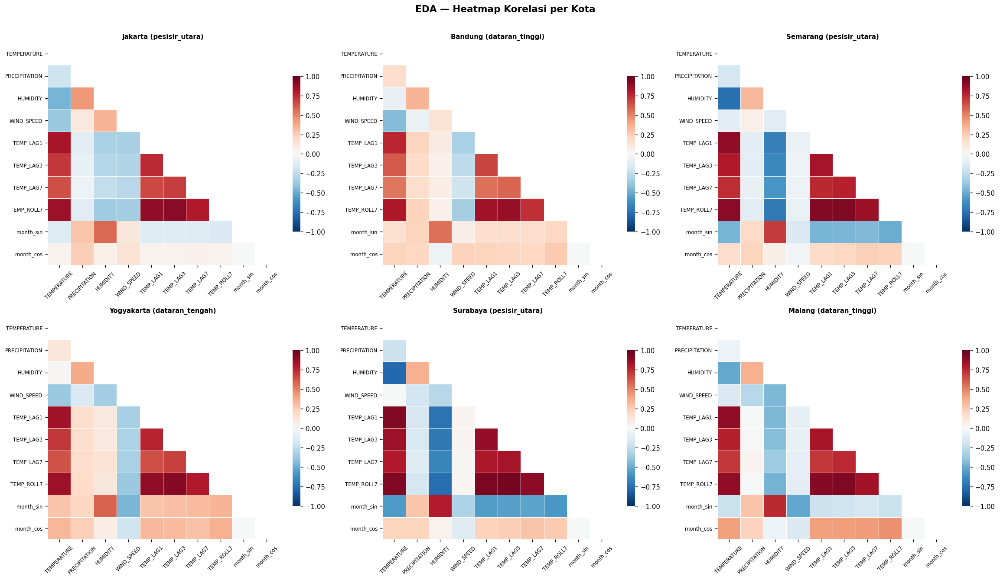

✅ eda_04_korelasi.png


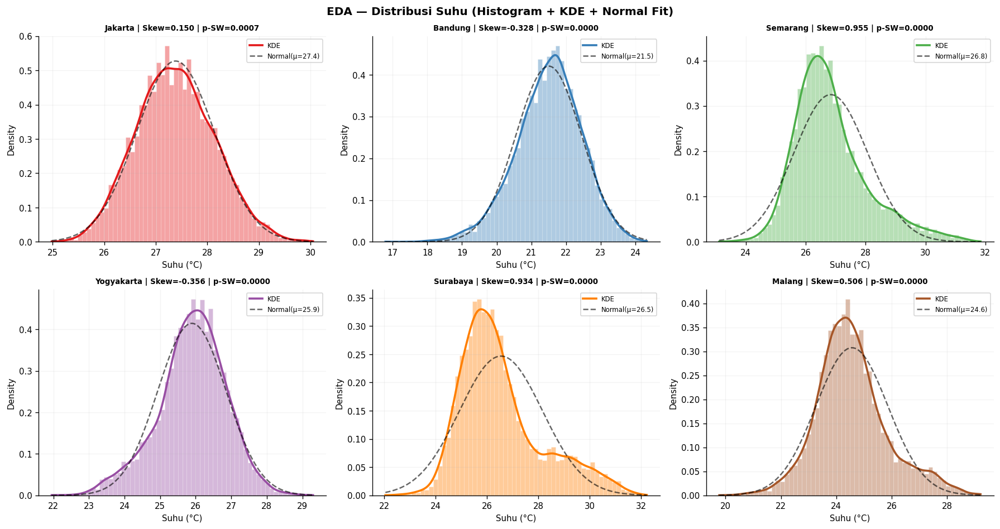

✅ eda_05_distribusi.png


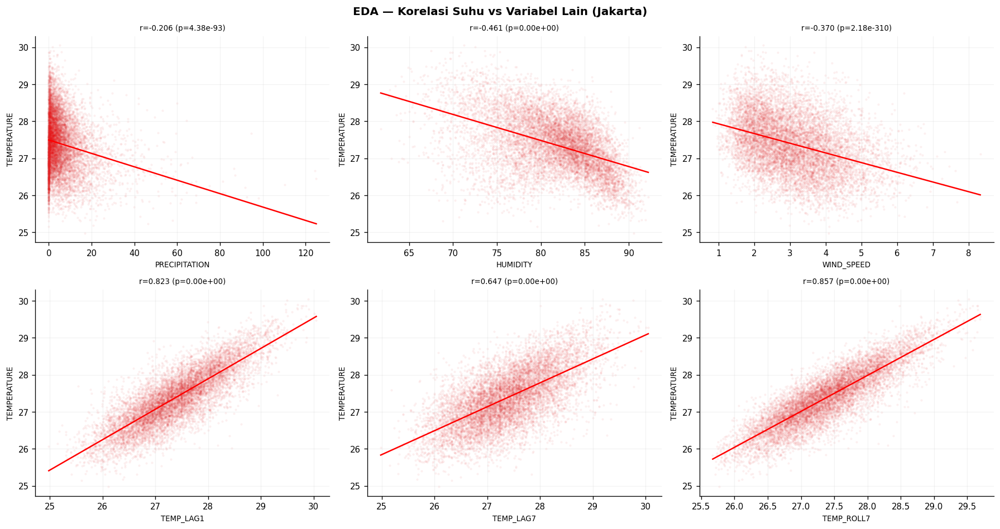

✅ eda_06_scatter.png

✅ EDA Bagian 2 selesai


In [7]:
print('='*70); print('  EDA 2 — KORELASI & DISTRIBUSI'); print('='*70)
corr_cols = ['TEMPERATURE','PRECIPITATION','HUMIDITY','WIND_SPEED',
             'TEMP_LAG1','TEMP_LAG3','TEMP_LAG7','TEMP_ROLL7','month_sin','month_cos']

# ── Plot 4: Heatmap korelasi per kota ──
n = len(city_dataframes); ncols = 3; nrows = math.ceil(n/ncols)
fig, axes = plt.subplots(nrows, ncols, figsize=(6.5*ncols, 5.5*nrows))
axes = axes.flatten()
for i, (city_name, df) in enumerate(city_dataframes.items()):
    corr = df[corr_cols].corr()
    mask = np.triu(np.ones_like(corr, dtype=bool))
    sns.heatmap(corr, mask=mask, ax=axes[i], cmap='RdBu_r', center=0, vmin=-1, vmax=1,
                annot=True, fmt='.2f', annot_kws={'size':7}, linewidths=0.4,
                cbar_kws={'shrink':0.7})
    axes[i].set_title(f'{city_name} ({CITIES[city_name]["zone"]})',
                      fontweight='bold', fontsize=9)
    axes[i].tick_params(axis='x', rotation=45, labelsize=7)
    axes[i].tick_params(axis='y', rotation=0, labelsize=7)
for j in range(i+1, len(axes)): axes[j].set_visible(False)
plt.suptitle('EDA — Heatmap Korelasi per Kota', fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout(); plt.savefig('eda_04_korelasi.png', dpi=150, bbox_inches='tight'); plt.show()
print('✅ eda_04_korelasi.png')

# ── Plot 5: Histogram + KDE + Normal fit ──
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
axes = axes.flatten()
for i, (city_name, df) in enumerate(city_dataframes.items()):
    ax = axes[i]; t = df['TEMPERATURE']
    clr = CITY_COLORS.get(city_name,'#333')
    ax.hist(t, bins=60, color=clr, alpha=0.4, density=True, ec='white', lw=0.3)
    kde = gaussian_kde(t); x = np.linspace(t.min(), t.max(), 300)
    ax.plot(x, kde(x), color=clr, lw=2.2, label='KDE')
    ax.plot(x, stats.norm.pdf(x, t.mean(), t.std()), 'k--', lw=1.5, alpha=0.6,
            label=f'Normal(μ={t.mean():.1f})')
    _, p_sw = stats.shapiro(t.sample(min(5000, len(t)), random_state=SEED))
    ax.set_title(f'{city_name} | Skew={stats.skew(t):.3f} | p-SW={p_sw:.4f}',
                 fontsize=8, fontweight='bold')
    ax.set_xlabel('Suhu (°C)'); ax.set_ylabel('Density')
    ax.legend(fontsize=7); ax.grid(True, alpha=0.15)
plt.suptitle('EDA — Distribusi Suhu (Histogram + KDE + Normal Fit)', fontsize=12, fontweight='bold')
plt.tight_layout(); plt.savefig('eda_05_distribusi.png', dpi=150, bbox_inches='tight'); plt.show()
print('✅ eda_05_distribusi.png')

# ── Plot 6: Scatter vs variabel lain ──
ref_city = list(city_dataframes.keys())[0]
df_ref = city_dataframes[ref_city]
scatter_vars = ['PRECIPITATION','HUMIDITY','WIND_SPEED','TEMP_LAG1','TEMP_LAG7','TEMP_ROLL7']
fig, axes = plt.subplots(2, 3, figsize=(15, 8)); axes = axes.flatten()
for i, var in enumerate(scatter_vars):
    ax = axes[i]
    ax.scatter(df_ref[var], df_ref['TEMPERATURE'], alpha=0.04, s=3,
               color=CITY_COLORS.get(ref_city,'#333'))
    z = np.polyfit(df_ref[var].dropna(), df_ref.loc[df_ref[var].notna(),'TEMPERATURE'], 1)
    x_s = np.linspace(df_ref[var].min(), df_ref[var].max(), 100)
    ax.plot(x_s, np.poly1d(z)(x_s), 'r-', lw=1.5)
    r, p_val = stats.pearsonr(df_ref[var].dropna(), df_ref.loc[df_ref[var].notna(),'TEMPERATURE'])
    ax.set_xlabel(var, fontsize=8); ax.set_ylabel('TEMPERATURE', fontsize=8)
    ax.set_title(f'r={r:.3f} (p={p_val:.2e})', fontsize=8); ax.grid(True, alpha=0.15)
plt.suptitle(f'EDA — Korelasi Suhu vs Variabel Lain ({ref_city})', fontsize=12, fontweight='bold')
plt.tight_layout(); plt.savefig('eda_06_scatter.png', dpi=150, bbox_inches='tight'); plt.show()
print('✅ eda_06_scatter.png')
print('\n✅ EDA Bagian 2 selesai')


## Cell 5C — EDA: Missing Value, Outlier & Tren Jangka Panjang

  EDA 3 — MISSING VALUE, OUTLIER & TREN

  Missing Value per Kota:
  Jakarta      ✅ total_null=0  {}
  Bandung      ✅ total_null=0  {}
  Semarang     ✅ total_null=0  {}
  Yogyakarta   ✅ total_null=0  {}
  Surabaya     ✅ total_null=0  {}
  Malang       ✅ total_null=0  {}
  ✅ Semua data bersih!

  Outlier IQR & Z-score TEMPERATURE:
  Kota              Q1      Q3     IQR   Lower   Upper   n_IQR   n_Z>3      %
  ---------------------------------------------------------------------------
  Jakarta       26.850  27.890   1.040  25.290  29.450      39      17  0.40%
  Bandung       20.910  22.140   1.230  19.065  23.985     130      41  1.35%
  Semarang      26.010  27.420   1.410  23.895  29.535     395     113  4.10%
  Yogyakarta    25.340  26.530   1.190  23.555  28.315     203      28  2.11%
  Surabaya      25.430  27.240   1.810  22.715  29.955     487      31  5.06%
  Malang        23.760  25.220   1.460  21.570  27.410     422      53  4.38%


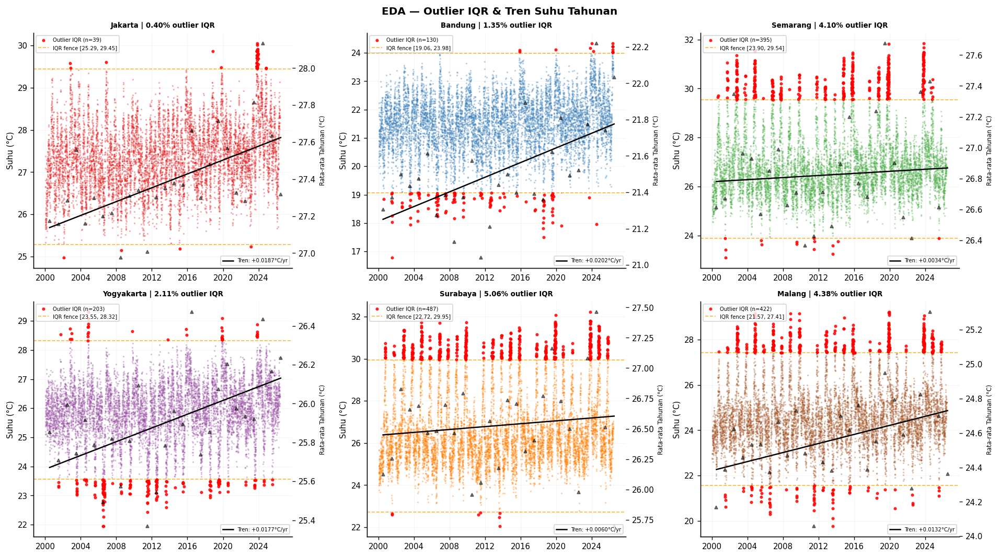

✅ eda_07_outlier_tren.png

  ACF TEMPERATURE — Justifikasi Fitur Lag:
  Kota           ACF-1   ACF-3   ACF-7   ACF-14
  ------------------------------------------
  Jakarta       0.8226  0.7046  0.6470   0.5748
  Bandung       0.7632  0.6173  0.5372   0.4652
  Semarang      0.8841  0.7994  0.7396   0.6797
  Yogyakarta    0.8498  0.7152  0.6393   0.5698
  Surabaya      0.9222  0.8536  0.8011   0.7399
  Malang        0.8864  0.7742  0.7040   0.6346
  → ACF tinggi pada lag 1–14 memvalidasi TEMP_LAG1/3/7 & WINDOW=14

✅ EDA Bagian 3 selesai

  ✅ SELURUH EDA SELESAI — Siap ke tahap Modeling


In [8]:
print('='*70); print('  EDA 3 — MISSING VALUE, OUTLIER & TREN'); print('='*70)
check_cols = ['TEMPERATURE','PRECIPITATION','HUMIDITY','WIND_SPEED',
              'TEMP_LAG1','TEMP_LAG7','TEMP_ROLL7']

# Missing value
print('\n  Missing Value per Kota:')
all_clean = True
for city_name, df in city_dataframes.items():
    nulls = df[check_cols].isnull().sum()
    total_null = nulls.sum()
    flag = ' ⚠️' if total_null > 0 else ' ✅'
    if total_null > 0: all_clean = False
    print(f'  {city_name:<12}{flag} total_null={total_null}  {dict(nulls[nulls>0])}')
print('  ✅ Semua data bersih!' if all_clean else '  ⚠️ Ada missing value!')

# Outlier
print('\n  Outlier IQR & Z-score TEMPERATURE:')
print(f'  {"Kota":<12} {"Q1":>7} {"Q3":>7} {"IQR":>7} {"Lower":>7} {"Upper":>7} '
      f'{"n_IQR":>7} {"n_Z>3":>7} {"%":>6}')
print('  '+'-'*75)
outlier_data = {}
for city_name, df in city_dataframes.items():
    t = df['TEMPERATURE']
    q1,q3 = t.quantile(0.25), t.quantile(0.75); iqr = q3-q1
    lo, hi = q1-1.5*iqr, q3+1.5*iqr
    n_iqr  = ((t<lo)|(t>hi)).sum()
    n_z    = (np.abs(stats.zscore(t)) > 3).sum()
    pct    = n_iqr/len(t)*100
    outlier_data[city_name] = {'lo':lo,'hi':hi,'n_iqr':n_iqr,'n_z':n_z,'pct':pct}
    print(f'  {city_name:<12} {q1:>7.3f} {q3:>7.3f} {iqr:>7.3f} {lo:>7.3f} '
          f'{hi:>7.3f} {n_iqr:>7} {n_z:>7} {pct:>5.2f}%')

# ── Plot 7: Outlier + Tren tahunan ──
fig, axes = plt.subplots(2, 3, figsize=(16, 9)); axes = axes.flatten()
for i, (city_name, df) in enumerate(city_dataframes.items()):
    ax = axes[i]; t = df['TEMPERATURE']
    outs = outlier_data[city_name]; lo, hi = outs['lo'], outs['hi']
    is_out = (t<lo)|(t>hi)
    ax.scatter(df['DATE'][~is_out], t[~is_out], s=1.2, alpha=0.25,
               color=CITY_COLORS.get(city_name,'#333'))
    ax.scatter(df['DATE'][is_out], t[is_out], s=7, alpha=0.8, color='red',
               zorder=5, label=f'Outlier IQR (n={is_out.sum()})')
    ax.axhline(lo, color='orange', lw=1, ls='--', alpha=0.8)
    ax.axhline(hi, color='orange', lw=1, ls='--', alpha=0.8,
               label=f'IQR fence [{lo:.2f}, {hi:.2f}]')
    df_yr = df.copy(); df_yr['year'] = df['DATE'].dt.year
    yr_avg = df_yr.groupby('year')['TEMPERATURE'].mean()
    z = np.polyfit(yr_avg.index, yr_avg.values, 1)
    ax2 = ax.twinx()
    ax2.plot(pd.to_datetime(yr_avg.index.astype(str)+'-07-01'), yr_avg.values,
             'k^', ms=4, alpha=0.5)
    ax2.plot(pd.to_datetime(yr_avg.index.astype(str)+'-07-01'),
             np.poly1d(z)(yr_avg.index), 'k-', lw=1.5,
             label=f'Tren: {z[0]:+.4f}°C/yr')
    ax2.set_ylabel('Rata-rata Tahunan (°C)', fontsize=7)
    ax2.legend(fontsize=6, loc='lower right')
    ax.set_title(f'{city_name} | {outs["pct"]:.2f}% outlier IQR',
                 fontweight='bold', fontsize=8)
    ax.set_ylabel('Suhu (°C)'); ax.legend(fontsize=6, loc='upper left')
    ax.grid(True, alpha=0.1)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    ax.xaxis.set_major_locator(mdates.YearLocator(4))
plt.suptitle('EDA — Outlier IQR & Tren Suhu Tahunan', fontsize=12, fontweight='bold')
plt.tight_layout(); plt.savefig('eda_07_outlier_tren.png', dpi=150, bbox_inches='tight'); plt.show()
print('✅ eda_07_outlier_tren.png')

# Autocorrelation ringkasan
print('\n  ACF TEMPERATURE — Justifikasi Fitur Lag:')
print(f'  {"Kota":<12} {"ACF-1":>7} {"ACF-3":>7} {"ACF-7":>7} {"ACF-14":>8}')
print('  ' + '-'*42)
for city_name, df in city_dataframes.items():
    t = df['TEMPERATURE']
    print(f'  {city_name:<12} '
          f'{t.autocorr(1):>7.4f} {t.autocorr(3):>7.4f} '
          f'{t.autocorr(7):>7.4f} {t.autocorr(14):>8.4f}')
print('  → ACF tinggi pada lag 1–14 memvalidasi TEMP_LAG1/3/7 & WINDOW=14')
print('\n✅ EDA Bagian 3 selesai')
print('\n' + '='*70)
print('  ✅ SELURUH EDA SELESAI — Siap ke tahap Modeling')
print('='*70)


## Cell 6 — Definisi Model & Fungsi Training

In [5]:
# ─── Sequence builder ────────────────────────────────────────────────────────
def create_sequences(data_sc, target_sc, window=WINDOW):
    X, y = [], []
    for i in range(len(data_sc)-window):
        X.append(data_sc[i:i+window]); y.append(target_sc[i+window])
    return np.array(X, dtype=np.float32), np.array(y, dtype=np.float32)

# ─── Scale & split untuk satu rasio ─────────────────────────────────────────
def scale_and_split_ratio(df, features, train_ratio, window=WINDOW, batch_size=BATCH_SIZE):
    """Scaler fit HANYA di train. Split KRONOLOGIS, tanpa shuffle."""
    n         = len(df); split_idx = int(train_ratio*n)
    train_df  = df.iloc[:split_idx]
    sc_x = MinMaxScaler(); sc_x.fit(train_df[features])
    sc_y = MinMaxScaler(); sc_y.fit(train_df[['TEMPERATURE']])
    data_sc   = sc_x.transform(df[features])
    target_sc = sc_y.transform(df[['TEMPERATURE']])
    X_seq, y_seq = create_sequences(data_sc, target_sc, window)
    seq_split    = int(train_ratio * len(X_seq))
    X_tr_all, X_te = X_seq[:seq_split], X_seq[seq_split:]
    y_tr_all, y_te = y_seq[:seq_split], y_seq[seq_split:]
    val_split      = int(0.90 * len(X_tr_all))
    X_tr, y_tr     = X_tr_all[:val_split], y_tr_all[:val_split]
    X_val, y_val   = X_tr_all[val_split:], y_tr_all[val_split:]
    train_loader = DataLoader(
        TensorDataset(torch.tensor(X_tr), torch.tensor(y_tr)),
        batch_size=batch_size, shuffle=False)
    val_loader = DataLoader(
        TensorDataset(torch.tensor(X_val), torch.tensor(y_val)),
        batch_size=batch_size, shuffle=False)
    return dict(
        sc_x=sc_x, sc_y=sc_y,
        X_tr=X_tr, y_tr=y_tr, X_val=X_val, y_val=y_val,
        X_te=X_te, y_te=y_te,
        train_loader=train_loader, val_loader=val_loader,
        seq_split=seq_split, input_dim=len(features),
        n_train=len(X_tr), n_val=len(X_val), n_test=len(X_te))

# ─── Arsitektur Model ─────────────────────────────────────────────────────────
class BigLSTM(nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        self.lstm = nn.LSTM(input_dim, 128, num_layers=3, batch_first=True, dropout=0.3)
        self.head = nn.Sequential(nn.Linear(128,32), nn.ReLU(), nn.Dropout(0.1), nn.Linear(32,1))
    def forward(self, x):
        out, _ = self.lstm(x); return self.head(out[:,-1,:])

class BigGRU(nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        self.gru  = nn.GRU(input_dim, 128, num_layers=3, batch_first=True, dropout=0.3)
        self.head = nn.Sequential(nn.Linear(128,32), nn.ReLU(), nn.Dropout(0.1), nn.Linear(32,1))
    def forward(self, x):
        out, _ = self.gru(x); return self.head(out[:,-1,:])

class PositionalEncoding(nn.Module):
    def __init__(self, d_model, max_len=500, dropout=0.1):
        super().__init__()
        self.dropout = nn.Dropout(p=dropout)
        pos = torch.arange(max_len).unsqueeze(1)
        div = torch.exp(torch.arange(0,d_model,2)*(-math.log(10000.0)/d_model))
        pe  = torch.zeros(1, max_len, d_model)
        pe[0,:,0::2] = torch.sin(pos*div); pe[0,:,1::2] = torch.cos(pos*div)
        self.register_buffer('pe', pe)
    def forward(self, x): return self.dropout(x + self.pe[:,:x.size(1),:])

class WeatherTransformer(nn.Module):
    def __init__(self, input_dim, d_model=64, nhead=4, num_layers=2):
        super().__init__()
        self.proj = nn.Linear(input_dim, d_model)
        self.pe   = PositionalEncoding(d_model)
        enc = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead,
              dim_feedforward=256, dropout=0.1, batch_first=True)
        self.enc  = nn.TransformerEncoder(enc, num_layers=num_layers)
        self.head = nn.Sequential(nn.Linear(d_model,32), nn.ReLU(), nn.Dropout(0.1), nn.Linear(32,1))
    def forward(self, x): return self.head(self.enc(self.pe(self.proj(x)))[:,-1,:])

# ─── Training ─────────────────────────────────────────────────────────────────
def train_model(model, name, train_loader, val_loader,
                ckpt_prefix='', lr=LR, patience=PATIENCE, epochs=EPOCHS):
    model     = model.to(DEVICE)
    save_path = f'best_{ckpt_prefix}_{name}.pt'
    if os.path.exists(save_path): os.remove(save_path)
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=20, factor=0.5)
    criterion = nn.MSELoss()
    best_val  = float('inf'); counter = 0
    train_losses, val_losses_hist = [], []
    print(f'    🚂 {name:<18} lr={lr}')
    for epoch in range(epochs):
        model.train(); ep_loss = []
        for Xb,yb in train_loader:
            Xb,yb = Xb.to(DEVICE), yb.to(DEVICE)
            optimizer.zero_grad()
            loss = criterion(model(Xb), yb)
            loss.backward(); nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step(); ep_loss.append(loss.item())
        model.eval(); vl = []
        with torch.no_grad():
            for Xb,yb in val_loader:
                vl.append(criterion(model(Xb.to(DEVICE)), yb.to(DEVICE)).item())
        val_loss = float(np.mean(vl)); train_loss = float(np.mean(ep_loss))
        train_losses.append(train_loss); val_losses_hist.append(val_loss)
        scheduler.step(val_loss)
        if val_loss < best_val:
            best_val = val_loss; torch.save(model.state_dict(), save_path); counter = 0
        else:
            counter += 1
        if counter >= patience:
            print(f'      ⏹ Early stop @ epoch {epoch+1} | best_val={best_val:.6f}'); break
        if (epoch+1) % 100 == 0:
            print(f'      Epoch {epoch+1:>3} | train={train_loss:.6f} | val={val_loss:.6f} | best={best_val:.6f}')
    model.load_state_dict(torch.load(save_path, map_location=DEVICE))
    return model, best_val, train_losses, val_losses_hist

# ─── Prediksi & Metrik ────────────────────────────────────────────────────────
def get_preds(model, X_te, sc_y):
    model.eval()
    with torch.no_grad():
        p = model(torch.tensor(X_te).to(DEVICE)).cpu().numpy()
    return sc_y.inverse_transform(p)

def compute_metrics(actual, pred):
    rmse = float(np.sqrt(mean_squared_error(actual, pred)))
    mae  = float(mean_absolute_error(actual, pred))
    r2   = float(r2_score(actual, pred))
    mape = float(np.mean(np.abs((actual-pred)/(actual+1e-8)))*100)
    return rmse, mae, r2, mape

# ─── Training satu kota ───────────────────────────────────────────────────────
def train_one_city(city_name, df_city, all_results_dict,
                   split_configs=None, features=None):
    if split_configs is None: split_configs = SPLIT_CONFIGS
    if features      is None: features      = BASE_FEATURES
    meta = CITIES[city_name]
    print(f'\n{"-"*65}')
    print(f'  KOTA: {city_name.upper()} | {meta["zone"]} | {len(df_city):,} baris')
    print(f'{"-"*65}')
    vl_log = {}
    for train_ratio, test_ratio, split_lbl, split_note in split_configs:
        print(f'\n  ┌─ Split [{split_lbl}]  {split_note}')
        sd = scale_and_split_ratio(df_city, features, train_ratio)
        print(f'  │  Train:{sd["n_train"]:>5} | Val:{sd["n_val"]:>4} | Test:{sd["n_test"]:>4}')
        if sd['n_train'] < 100 or sd['n_test'] < 10:
            print(f'  │  ⚠️  Terlalu sedikit — skip'); continue
        ckpt = f'{city_name.lower()}_{split_lbl.replace("/","_")}'
        m_lstm, vl, tl_lstm, vl_lstm = train_model(BigLSTM(sd['input_dim']),
            'biglstm', sd['train_loader'], sd['val_loader'], ckpt_prefix=ckpt)
        m_gru,  vg, tl_gru,  vl_gru  = train_model(BigGRU(sd['input_dim']),
            'biggru',  sd['train_loader'], sd['val_loader'], ckpt_prefix=ckpt)
        m_tr,   vt, tl_tr,   vl_tr   = train_model(WeatherTransformer(sd['input_dim']),
            'transformer', sd['train_loader'], sd['val_loader'], ckpt_prefix=ckpt)
        vl_log[split_lbl] = {'lstm':vl, 'gru':vg, 'tr':vt}
        actual  = sd['sc_y'].inverse_transform(sd['y_te'])
        p_lstm  = get_preds(m_lstm, sd['X_te'], sd['sc_y'])
        p_gru   = get_preds(m_gru,  sd['X_te'], sd['sc_y'])
        p_tr    = get_preds(m_tr,   sd['X_te'], sd['sc_y'])
        val_arr = np.array([vl, vg, vt])
        w       = (1/val_arr) / (1/val_arr).sum()
        p_ens   = w[0]*p_lstm + w[1]*p_gru + w[2]*p_tr
        t_start = sd['seq_split'] + WINDOW
        n_test  = len(actual)
        persist = df_city['TEMPERATURE'].iloc[
            t_start-1 : t_start-1+n_test].values.reshape(-1,1)
        min_len = min(len(persist), n_test)
        actual, p_ens  = actual[:min_len],  p_ens[:min_len]
        persist        = persist[:min_len]
        p_lstm, p_gru, p_tr = p_lstm[:min_len], p_gru[:min_len], p_tr[:min_len]
        rmse_p, _,_,_       = compute_metrics(actual, persist)
        rmse_e,mae_e,r2_e,mape_e = compute_metrics(actual, p_ens)
        rmse_l,_,r2_l,_     = compute_metrics(actual, p_lstm)
        rmse_g,_,r2_g,_     = compute_metrics(actual, p_gru)
        rmse_t,_,r2_t,_     = compute_metrics(actual, p_tr)
        impr = (rmse_p-rmse_e)/rmse_p*100
        print(f'  │  Ensemble RMSE:{rmse_e:.4f}°C MAE:{mae_e:.4f} R²:{r2_e:.4f} MAPE:{mape_e:.2f}%')
        print(f'  │  Baseline RMSE:{rmse_p:.4f}°C → Impr:{impr:.1f}%')
        all_results_dict[city_name][split_lbl] = dict(
            rmse=rmse_e, mae=mae_e, r2=r2_e, mape=mape_e,
            rmse_persist=rmse_p, improvement=impr,
            rmse_lstm=rmse_l, rmse_gru=rmse_g, rmse_tr=rmse_t,
            r2_lstm=r2_l, r2_gru=r2_g, r2_tr=r2_t,
            w_lstm=float(w[0]), w_gru=float(w[1]), w_tr=float(w[2]),
            actual=actual, pred=p_ens, persist=persist,
            pred_lstm=p_lstm, pred_gru=p_gru, pred_tr=p_tr,
            train_losses_lstm=tl_lstm, val_losses_lstm=vl_lstm,
            train_losses_gru=tl_gru,  val_losses_gru=vl_gru,
            train_losses_tr=tl_tr,    val_losses_tr=vl_tr,
            split_lbl=split_lbl, split_note=split_note,
            n_train=sd['n_train'], n_val=sd['n_val'], n_test=min_len,
            test_start_df=t_start,
        )
        print(f'  └─ ✅ [{split_lbl}] selesai')
    log_path = f'val_loss_{city_name.lower()}.json'
    with open(log_path,'w') as f: json.dump(vl_log, f, indent=2)
    print(f'\n  💾 val_loss log: {log_path}')
    print(f'  ✅ {city_name.upper()} — selesai')

n_l = sum(p.numel() for p in BigLSTM(len(BASE_FEATURES)).parameters())
n_g = sum(p.numel() for p in BigGRU(len(BASE_FEATURES)).parameters())
n_t = sum(p.numel() for p in WeatherTransformer(len(BASE_FEATURES)).parameters())
print(f'✅ Model & fungsi siap')
print(f'   BigLSTM    : {n_l:,} params')
print(f'   BigGRU     : {n_g:,} params')
print(f'   Transformer: {n_t:,} params')


✅ Model & fungsi siap
   BigLSTM    : 341,057 params
   BigGRU     : 256,833 params
   Transformer: 102,913 params


## Cell 7 — Training & Evaluasi: Jakarta

> Cell ini **berdiri sendiri** — jalankan setelah Cell 6.
> Hasil tersimpan ke `all_results['Jakarta']` dan file `.pt` per split.

In [11]:
# ==============================================================
#  TRAINING — JAKARTA
# ==============================================================
CITY_NOW = 'Jakarta'
if CITY_NOW not in city_dataframes:
    print(f'⚠️  {CITY_NOW}: data tidak ada. Jalankan Cell 4 dulu.')
else:
    zone = CITIES[CITY_NOW]['zone']
    elev = CITIES[CITY_NOW]['elev']
    print('='*65)
    print(f'  TRAINING — {CITY_NOW.upper()}')
    print(f'  {zone} | elev {elev:.0f}m')
    print('='*65)
    train_one_city(CITY_NOW, city_dataframes[CITY_NOW], all_results)
    print(f'\n🎉 {CITY_NOW} selesai! Splits: {list(all_results[CITY_NOW].keys())}')

  TRAINING — JAKARTA
  pesisir_utara | elev 8m

-----------------------------------------------------------------
  KOTA: JAKARTA | pesisir_utara | 9,630 baris
-----------------------------------------------------------------

  ┌─ Split [90/10]  Agresif — banyak train, sedikit test
  │  Train: 7788 | Val: 866 | Test: 962
    🚂 biglstm            lr=0.0003
      Epoch 100 | train=0.006898 | val=0.005743 | best=0.005714
      Epoch 200 | train=0.006658 | val=0.005668 | best=0.005660
      Epoch 300 | train=0.006634 | val=0.005636 | best=0.005632
      Epoch 400 | train=0.006619 | val=0.005630 | best=0.005622
      ⏹ Early stop @ epoch 458 | best_val=0.005622
    🚂 biggru             lr=0.0003
      Epoch 100 | train=0.007066 | val=0.005720 | best=0.005696
      Epoch 200 | train=0.006611 | val=0.005618 | best=0.005595
      Epoch 300 | train=0.006437 | val=0.005566 | best=0.005565
      Epoch 400 | train=0.006450 | val=0.005574 | best=0.005555
      ⏹ Early stop @ epoch 435 | best_val=0

## Cell 8 — Training & Evaluasi: Bandung

> Cell ini **berdiri sendiri** — jalankan setelah Cell 6.
> Hasil tersimpan ke `all_results['Bandung']` dan file `.pt` per split.

In [12]:
# ==============================================================
#  TRAINING — BANDUNG
# ==============================================================
CITY_NOW = 'Bandung'
if CITY_NOW not in city_dataframes:
    print(f'⚠️  {CITY_NOW}: data tidak ada. Jalankan Cell 4 dulu.')
else:
    zone = CITIES[CITY_NOW]['zone']
    elev = CITIES[CITY_NOW]['elev']
    print('='*65)
    print(f'  TRAINING — {CITY_NOW.upper()}')
    print(f'  {zone} | elev {elev:.0f}m')
    print('='*65)
    train_one_city(CITY_NOW, city_dataframes[CITY_NOW], all_results)
    print(f'\n🎉 {CITY_NOW} selesai! Splits: {list(all_results[CITY_NOW].keys())}')

  TRAINING — BANDUNG
  dataran_tinggi | elev 768m

-----------------------------------------------------------------
  KOTA: BANDUNG | dataran_tinggi | 9,630 baris
-----------------------------------------------------------------

  ┌─ Split [90/10]  Agresif — banyak train, sedikit test
  │  Train: 7788 | Val: 866 | Test: 962
    🚂 biglstm            lr=0.0003
      Epoch 100 | train=0.006255 | val=0.006235 | best=0.006062
      Epoch 200 | train=0.006063 | val=0.005893 | best=0.005893
      Epoch 300 | train=0.006000 | val=0.005876 | best=0.005864
      ⏹ Early stop @ epoch 352 | best_val=0.005864
    🚂 biggru             lr=0.0003
      Epoch 100 | train=0.006516 | val=0.006124 | best=0.006005
      Epoch 200 | train=0.006070 | val=0.005901 | best=0.005883
      Epoch 300 | train=0.005965 | val=0.005889 | best=0.005864
      ⏹ Early stop @ epoch 310 | best_val=0.005864
    🚂 transformer        lr=0.0003
      Epoch 100 | train=0.006469 | val=0.006046 | best=0.006046
      Epoch 200 |

## Cell 9 — Training & Evaluasi: Semarang

> Cell ini **berdiri sendiri** — jalankan setelah Cell 6.
> Hasil tersimpan ke `all_results['Semarang']` dan file `.pt` per split.

In [13]:
# ==============================================================
#  TRAINING — SEMARANG
# ==============================================================
CITY_NOW = 'Semarang'
if CITY_NOW not in city_dataframes:
    print(f'⚠️  {CITY_NOW}: data tidak ada. Jalankan Cell 4 dulu.')
else:
    zone = CITIES[CITY_NOW]['zone']
    elev = CITIES[CITY_NOW]['elev']
    print('='*65)
    print(f'  TRAINING — {CITY_NOW.upper()}')
    print(f'  {zone} | elev {elev:.0f}m')
    print('='*65)
    train_one_city(CITY_NOW, city_dataframes[CITY_NOW], all_results)
    print(f'\n🎉 {CITY_NOW} selesai! Splits: {list(all_results[CITY_NOW].keys())}')

  TRAINING — SEMARANG
  pesisir_utara | elev 5m

-----------------------------------------------------------------
  KOTA: SEMARANG | pesisir_utara | 9,630 baris
-----------------------------------------------------------------

  ┌─ Split [90/10]  Agresif — banyak train, sedikit test
  │  Train: 7788 | Val: 866 | Test: 962
    🚂 biglstm            lr=0.0003
      Epoch 100 | train=0.004084 | val=0.003331 | best=0.003294
      Epoch 200 | train=0.003914 | val=0.003280 | best=0.003273
      ⏹ Early stop @ epoch 257 | best_val=0.003273
    🚂 biggru             lr=0.0003
      Epoch 100 | train=0.004112 | val=0.003370 | best=0.003330
      Epoch 200 | train=0.003852 | val=0.003306 | best=0.003290
      Epoch 300 | train=0.003866 | val=0.003314 | best=0.003286
      ⏹ Early stop @ epoch 303 | best_val=0.003286
    🚂 transformer        lr=0.0003
      Epoch 100 | train=0.003937 | val=0.003388 | best=0.003251
      Epoch 200 | train=0.003740 | val=0.003203 | best=0.003185
      ⏹ Early stop 

## Cell 10 — Training & Evaluasi: Yogyakarta

> Cell ini **berdiri sendiri** — jalankan setelah Cell 6.
> Hasil tersimpan ke `all_results['Yogyakarta']` dan file `.pt` per split.

In [7]:
# ==============================================================
#  TRAINING — YOGYAKARTA
# ==============================================================
CITY_NOW = 'Yogyakarta'
if CITY_NOW not in city_dataframes:
    print(f'⚠️  {CITY_NOW}: data tidak ada. Jalankan Cell 4 dulu.')
else:
    zone = CITIES[CITY_NOW]['zone']
    elev = CITIES[CITY_NOW]['elev']
    print('='*65)
    print(f'  TRAINING — {CITY_NOW.upper()}')
    print(f'  {zone} | elev {elev:.0f}m')
    print('='*65)
    train_one_city(CITY_NOW, city_dataframes[CITY_NOW], all_results)
    print(f'\n🎉 {CITY_NOW} selesai! Splits: {list(all_results[CITY_NOW].keys())}')

  TRAINING — YOGYAKARTA
  dataran_tengah | elev 114m

-----------------------------------------------------------------
  KOTA: YOGYAKARTA | dataran_tengah | 9,630 baris
-----------------------------------------------------------------

  ┌─ Split [90/10]  Agresif — banyak train, sedikit test
  │  Train: 7788 | Val: 866 | Test: 962
    🚂 biglstm            lr=0.0003
      Epoch 100 | train=0.004547 | val=0.003615 | best=0.003615
      Epoch 200 | train=0.004384 | val=0.003551 | best=0.003550
      Epoch 300 | train=0.004389 | val=0.003549 | best=0.003547
      ⏹ Early stop @ epoch 335 | best_val=0.003547
    🚂 biggru             lr=0.0003
      Epoch 100 | train=0.004648 | val=0.003684 | best=0.003607
      Epoch 200 | train=0.004349 | val=0.003546 | best=0.003539
      Epoch 300 | train=0.004358 | val=0.003531 | best=0.003529
      ⏹ Early stop @ epoch 340 | best_val=0.003529
    🚂 transformer        lr=0.0003
      Epoch 100 | train=0.004751 | val=0.003886 | best=0.003670
      Epoch

## Cell 11 — Training & Evaluasi: Surabaya

> Cell ini **berdiri sendiri** — jalankan setelah Cell 6.
> Hasil tersimpan ke `all_results['Surabaya']` dan file `.pt` per split.

In [6]:
# ==============================================================
#  TRAINING — SURABAYA
# ==============================================================
CITY_NOW = 'Surabaya'
if CITY_NOW not in city_dataframes:
    print(f'⚠️  {CITY_NOW}: data tidak ada. Jalankan Cell 4 dulu.')
else:
    zone = CITIES[CITY_NOW]['zone']
    elev = CITIES[CITY_NOW]['elev']
    print('='*65)
    print(f'  TRAINING — {CITY_NOW.upper()}')
    print(f'  {zone} | elev {elev:.0f}m')
    print('='*65)
    train_one_city(CITY_NOW, city_dataframes[CITY_NOW], all_results)
    print(f'\n🎉 {CITY_NOW} selesai! Splits: {list(all_results[CITY_NOW].keys())}')

  TRAINING — SURABAYA
  pesisir_utara | elev 6m

-----------------------------------------------------------------
  KOTA: SURABAYA | pesisir_utara | 9,630 baris
-----------------------------------------------------------------

  ┌─ Split [90/10]  Agresif — banyak train, sedikit test
  │  Train: 7788 | Val: 866 | Test: 962
    🚂 biglstm            lr=0.0003
      Epoch 100 | train=0.003742 | val=0.003310 | best=0.003297
      Epoch 200 | train=0.003516 | val=0.003286 | best=0.003275
      ⏹ Early stop @ epoch 255 | best_val=0.003275
    🚂 biggru             lr=0.0003
      Epoch 100 | train=0.003692 | val=0.003260 | best=0.003228
      Epoch 200 | train=0.003470 | val=0.003223 | best=0.003217
      ⏹ Early stop @ epoch 286 | best_val=0.003217
    🚂 transformer        lr=0.0003
      Epoch 100 | train=0.003851 | val=0.003276 | best=0.003210
      Epoch 200 | train=0.003437 | val=0.003133 | best=0.003112
      ⏹ Early stop @ epoch 294 | best_val=0.003108
  │  Ensemble RMSE:0.5490°C MAE:

## Cell 12 — Training & Evaluasi: Malang

> Cell ini **berdiri sendiri** — jalankan setelah Cell 6.
> Hasil tersimpan ke `all_results['Malang']` dan file `.pt` per split.

In [7]:
# ==============================================================
#  TRAINING — MALANG
# ==============================================================
CITY_NOW = 'Malang'
if CITY_NOW not in city_dataframes:
    print(f'⚠️  {CITY_NOW}: data tidak ada. Jalankan Cell 4 dulu.')
else:
    zone = CITIES[CITY_NOW]['zone']
    elev = CITIES[CITY_NOW]['elev']
    print('='*65)
    print(f'  TRAINING — {CITY_NOW.upper()}')
    print(f'  {zone} | elev {elev:.0f}m')
    print('='*65)
    train_one_city(CITY_NOW, city_dataframes[CITY_NOW], all_results)
    print(f'\n🎉 {CITY_NOW} selesai! Splits: {list(all_results[CITY_NOW].keys())}')

  TRAINING — MALANG
  dataran_tinggi | elev 445m

-----------------------------------------------------------------
  KOTA: MALANG | dataran_tinggi | 9,630 baris
-----------------------------------------------------------------

  ┌─ Split [90/10]  Agresif — banyak train, sedikit test
  │  Train: 7788 | Val: 866 | Test: 962
    🚂 biglstm            lr=0.0003
      Epoch 100 | train=0.004020 | val=0.003689 | best=0.003568
      Epoch 200 | train=0.003758 | val=0.003463 | best=0.003460
      Epoch 300 | train=0.003672 | val=0.003455 | best=0.003452
      ⏹ Early stop @ epoch 353 | best_val=0.003452
    🚂 biggru             lr=0.0003
      Epoch 100 | train=0.003816 | val=0.003586 | best=0.003503
      Epoch 200 | train=0.003661 | val=0.003437 | best=0.003432
      Epoch 300 | train=0.003607 | val=0.003422 | best=0.003422
      ⏹ Early stop @ epoch 387 | best_val=0.003420
    🚂 transformer        lr=0.0003
      Epoch 100 | train=0.004243 | val=0.003680 | best=0.003580
      Epoch 200 | t

## Cell 13 — Tabel Ringkasan Metrik Semua Kota × Semua Split

In [12]:
print('\n' + '='*90)
print('  TABEL RINGKASAN — SEMUA KOTA × SEMUA SPLIT')
print('='*90)

rows = []
for city_name in city_dataframes:
    for _, _, split_lbl, split_note in SPLIT_CONFIGS:
        if split_lbl not in all_results[city_name]: continue
        r = all_results[city_name][split_lbl]
        rows.append(dict(
            Kota=city_name, Zone=CITIES[city_name]['zone'],
            Elevasi_m=CITIES[city_name]['elev'], Split=split_lbl,
            N_Train=r['n_train'], N_Test=r['n_test'],
            RMSE_Baseline=round(r['rmse_persist'],4),
            RMSE_Ensemble=round(r['rmse'],4),
            RMSE_LSTM=round(r['rmse_lstm'],4),
            RMSE_GRU=round(r['rmse_gru'],4),
            RMSE_Transformer=round(r['rmse_tr'],4),
            MAE=round(r['mae'],4), R2=round(r['r2'],4),
            MAPE_pct=round(r['mape'],2),
            Improvement_pct=round(r['improvement'],2),
            W_LSTM=round(r['w_lstm'],3), W_GRU=round(r['w_gru'],3),
            W_Transformer=round(r['w_tr'],3),
        ))

df_summary = pd.DataFrame(rows)
print(df_summary.to_string(index=False))

# Rata-rata per split
print('\n\n  RATA-RATA METRIK PER SPLIT (lintas kota):')
print(f'  {"Split":>6}  {"RMSE_Ens":>9} {"MAE":>8} {"R²":>7} {"MAPE%":>7} {"Impr%":>7}')
print('  '+'-'*55)
for _,_,split_lbl,_ in SPLIT_CONFIGS:
    sub = df_summary[df_summary['Split']==split_lbl]
    if sub.empty: continue
    warn = ' ⚠️' if split_lbl=='50/50' else ''
    print(f'  {split_lbl:>6}  {sub["RMSE_Ensemble"].mean():>9.4f} '
          f'{sub["MAE"].mean():>8.4f} {sub["R2"].mean():>7.4f} '
          f'{sub["MAPE_pct"].mean():>7.2f}% {sub["Improvement_pct"].mean():>7.1f}%{warn}')

df_summary.to_csv('hasil_multi_split.csv', index=False)
print('\n✅ Tersimpan: hasil_multi_split.csv')
if not df_summary.empty:
    cand = df_summary[df_summary['Split']!='50/50']
    best = cand.loc[cand['RMSE_Ensemble'].idxmin()]
    print(f'🏆 RMSE terbaik: [{best["Split"]}] kota {best["Kota"]} → {best["RMSE_Ensemble"]:.4f}°C')



  TABEL RINGKASAN — SEMUA KOTA × SEMUA SPLIT
      Kota           Zone  Elevasi_m Split  N_Train  N_Test  RMSE_Baseline  RMSE_Ensemble  RMSE_LSTM  RMSE_GRU  RMSE_Transformer    MAE     R2  MAPE_pct  Improvement_pct  W_LSTM  W_GRU  W_Transformer
   Jakarta  pesisir_utara     8.0000 90/10     8654     962         0.4480         0.3891     0.3895    0.3914            0.3951 0.3073 0.7645    1.1000          13.1500  0.3290 0.3330         0.3390
   Jakarta  pesisir_utara     8.0000 80/20     7692    1924         0.4415         0.3781     0.3795    0.3815            0.3855 0.2985 0.7492    1.0800          14.3600  0.3260 0.3200         0.3540
   Jakarta  pesisir_utara     8.0000 70/30     6731    2885         0.4464         0.3826     0.3861    0.3847            0.3851 0.3016 0.7405    1.0900          14.2900  0.3340 0.3340         0.3320
   Jakarta  pesisir_utara     8.0000 60/40     5769    3847         0.4490         0.3832     0.3835    0.3860            0.3856 0.2988 0.7261    1.0900  

## Cell 14 — Visualisasi Lengkap Hasil Training & Prediksi

> Cell ini menampilkan **semua visualisasi penting** dari hasil training:
> - Loss curve train vs validasi per model per split
> - Prediksi vs aktual (overlay & per split)
> - Residual & error distribution
> - Scatter plot prediksi vs aktual
> - Perbandingan RMSE antar model & kota
> - Heatmap performa
> - Bobot ensemble & contribution analysis
> 
> Semua grafik dihasilkan dari `all_results` (in-memory) atau bisa
> di-load ulang dari `.pt` + CSV menggunakan **Cell Recovery**.

  DIAGNOSTIC: Cek ketersediaan data kota
  Kota di CITIES         : ['Jakarta', 'Bandung', 'Semarang', 'Yogyakarta', 'Surabaya', 'Malang']
  Kota di city_dataframes: ['Jakarta', 'Bandung', 'Semarang', 'Yogyakarta', 'Surabaya', 'Malang']
  Kota di all_results    : ['Jakarta', 'Bandung', 'Semarang', 'Yogyakarta', 'Surabaya', 'Malang']
  Jakarta: 9630 baris | splits: ['90/10', '80/20', '70/30', '60/40', '50/50']
  Bandung: 9630 baris | splits: ['90/10', '80/20', '70/30', '60/40', '50/50']
  Semarang: 9630 baris | splits: ['90/10', '80/20', '70/30', '60/40', '50/50']
  Yogyakarta: 9630 baris | splits: ['90/10', '80/20', '70/30', '60/40', '50/50']
  Surabaya: 9630 baris | splits: ['90/10', '80/20', '70/30', '60/40', '50/50']
  Malang: 9630 baris | splits: ['90/10', '80/20', '70/30', '60/40', '50/50']

  Membuat Plot A: Val Loss & RMSE per Model per Split...


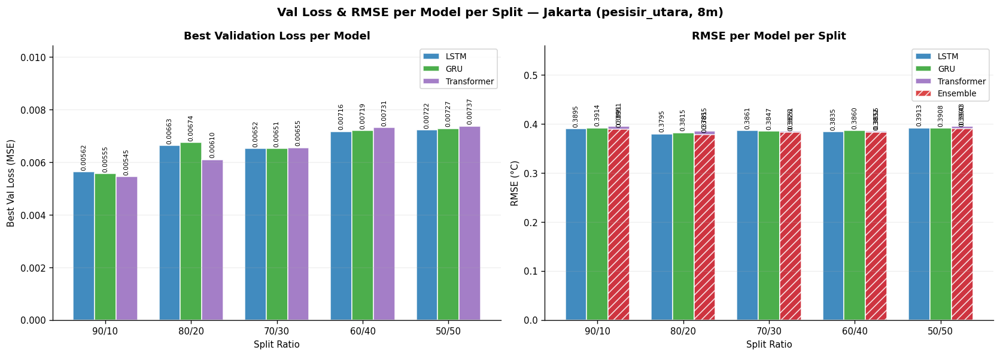

  ✅ result_A_losscurve_jakarta.png


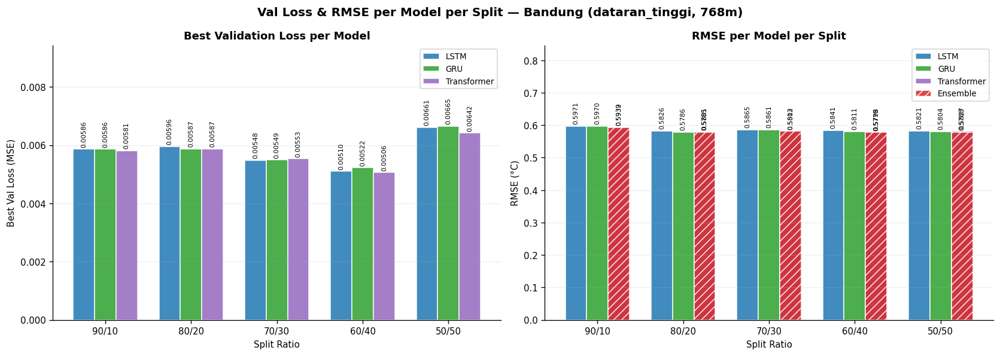

  ✅ result_A_losscurve_bandung.png


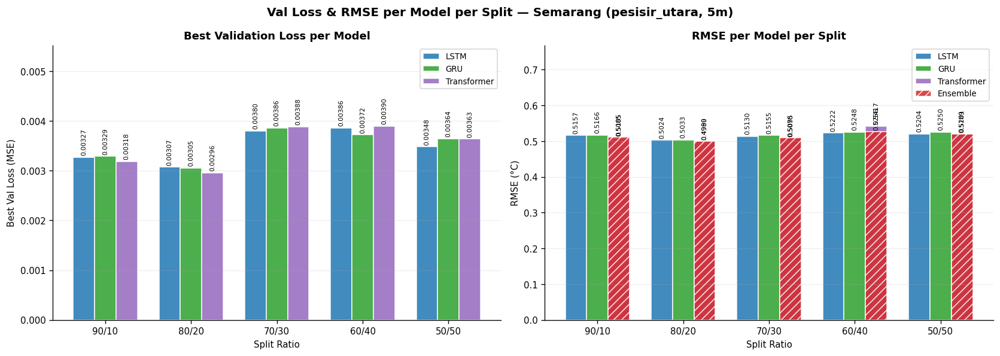

  ✅ result_A_losscurve_semarang.png


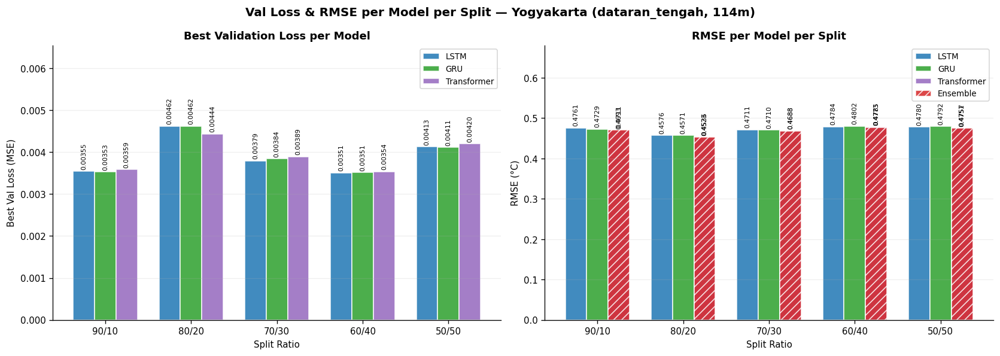

  ✅ result_A_losscurve_yogyakarta.png


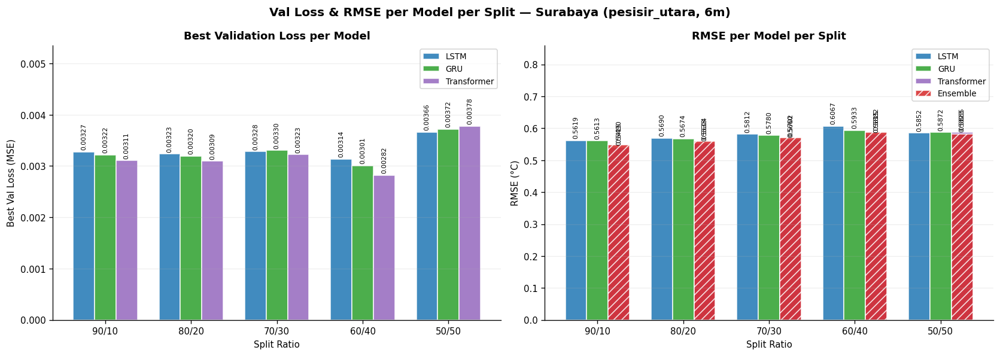

  ✅ result_A_losscurve_surabaya.png


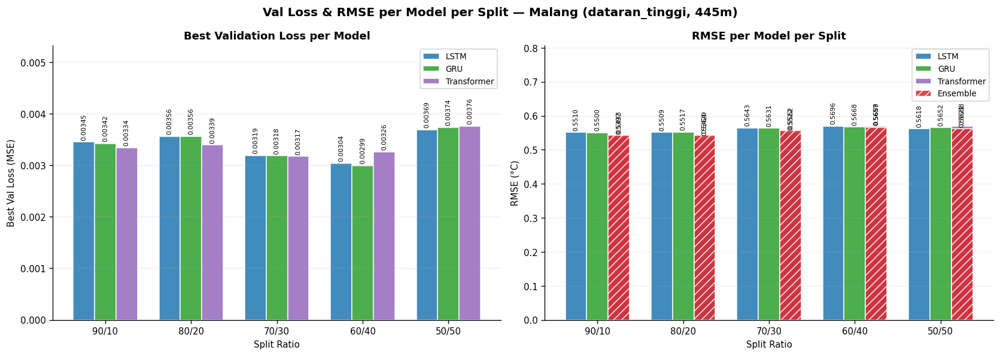

  ✅ result_A_losscurve_malang.png

  Membuat Plot B: Prediksi vs Aktual Overlay...


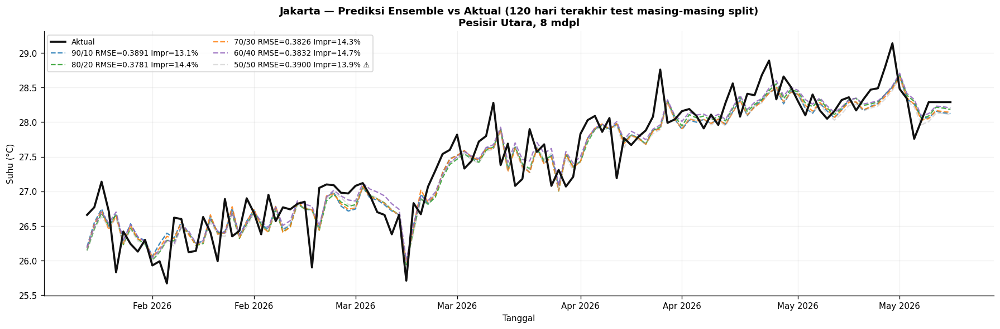

  ✅ result_B_pred_overlay_jakarta.png


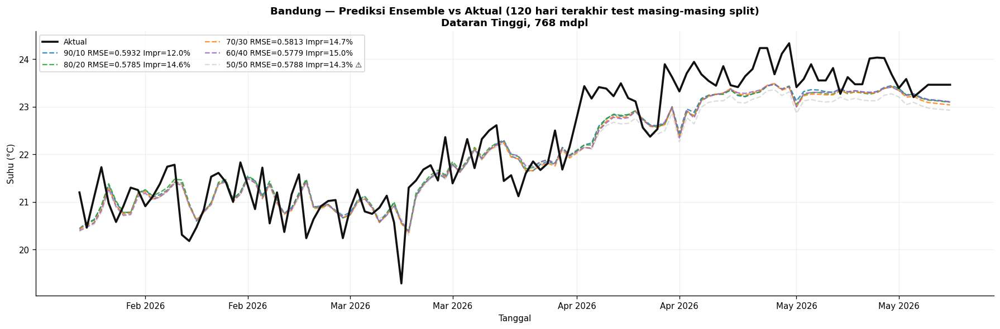

  ✅ result_B_pred_overlay_bandung.png


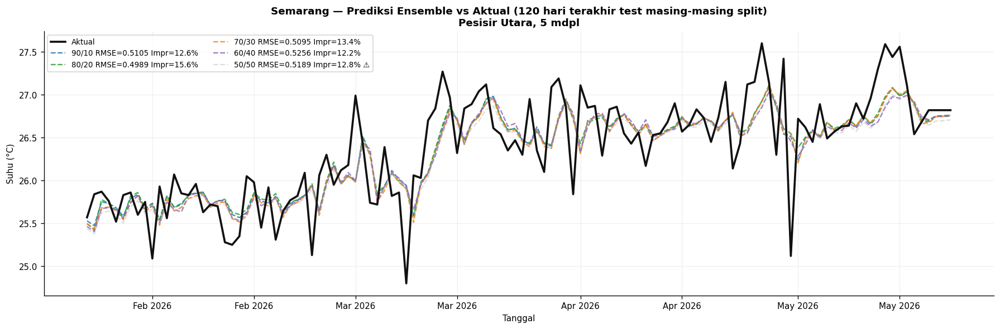

  ✅ result_B_pred_overlay_semarang.png


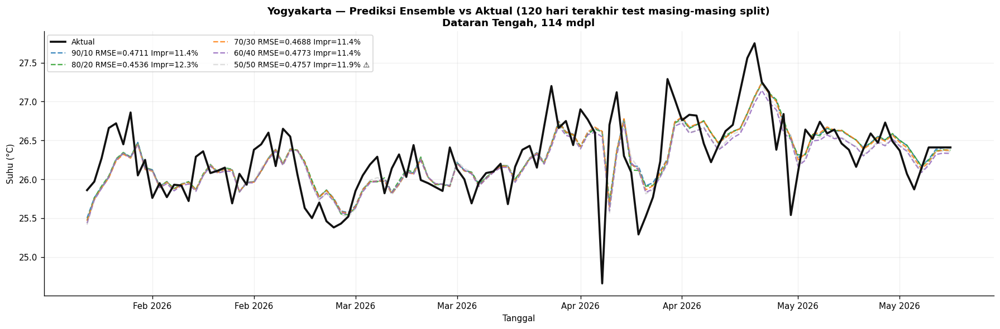

  ✅ result_B_pred_overlay_yogyakarta.png


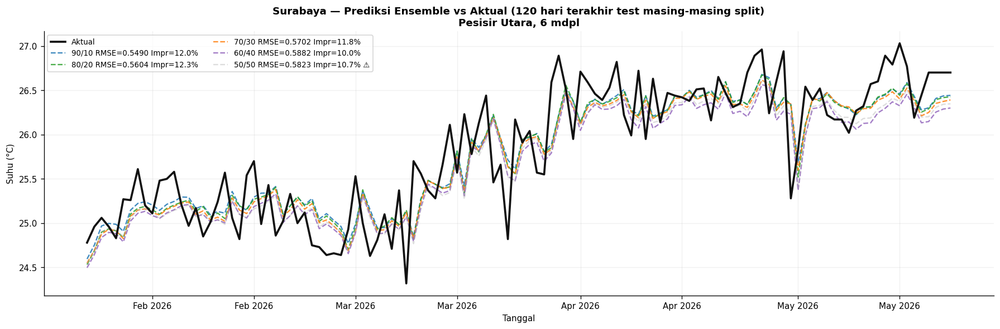

  ✅ result_B_pred_overlay_surabaya.png


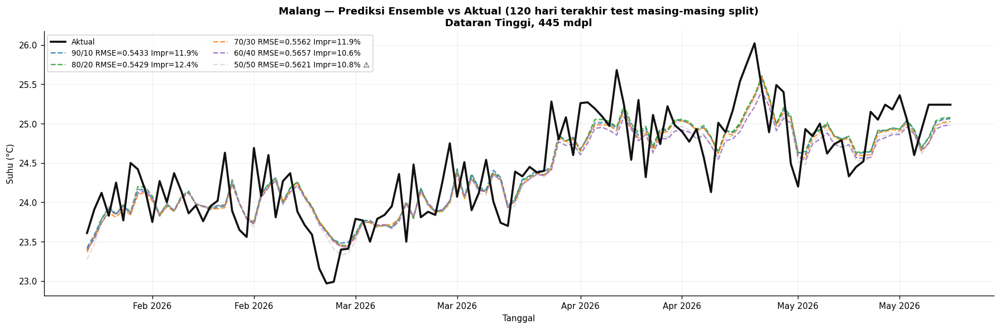

  ✅ result_B_pred_overlay_malang.png

  Membuat Plot C: Subplot per Split...


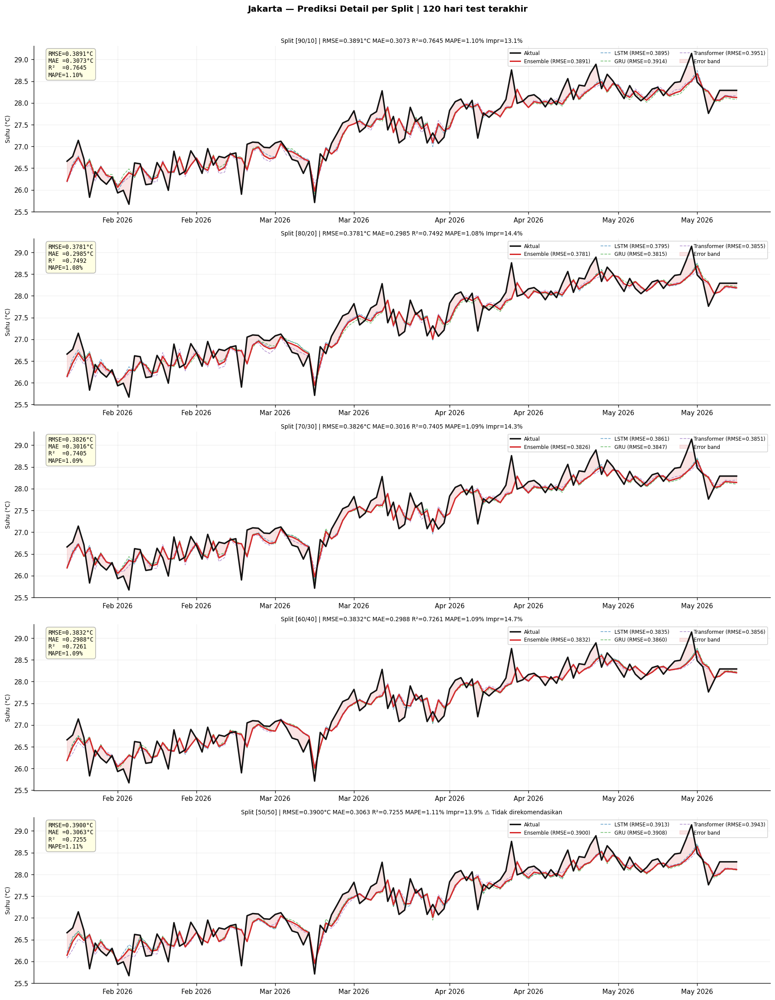

  ✅ result_C_pred_persplit_jakarta.png


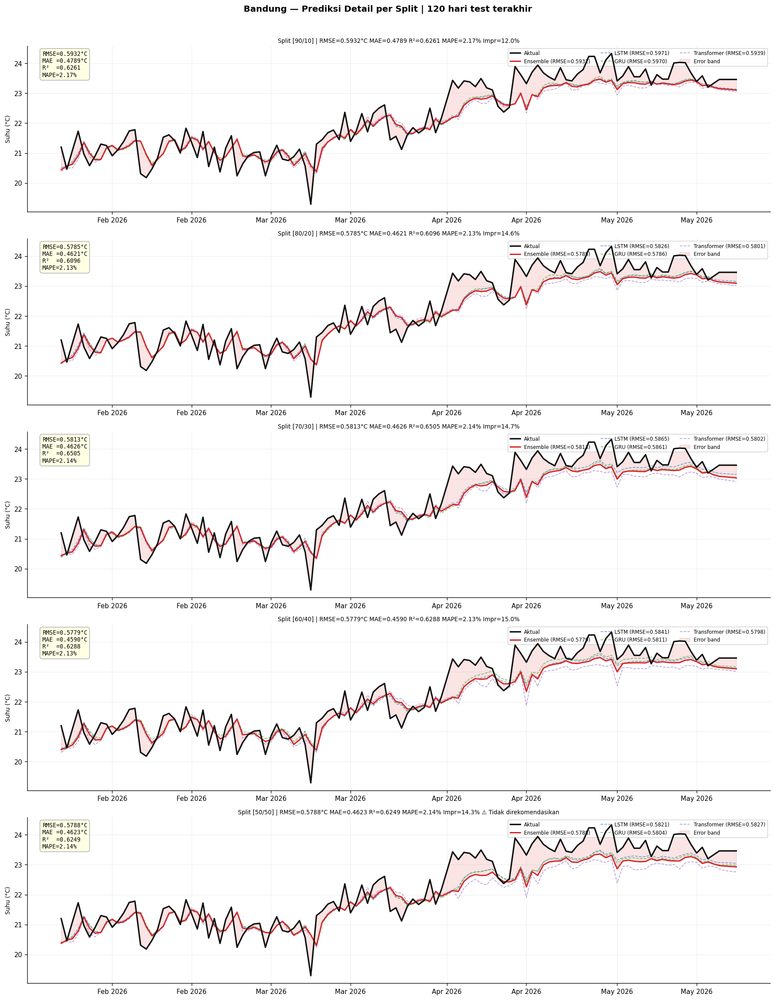

  ✅ result_C_pred_persplit_bandung.png


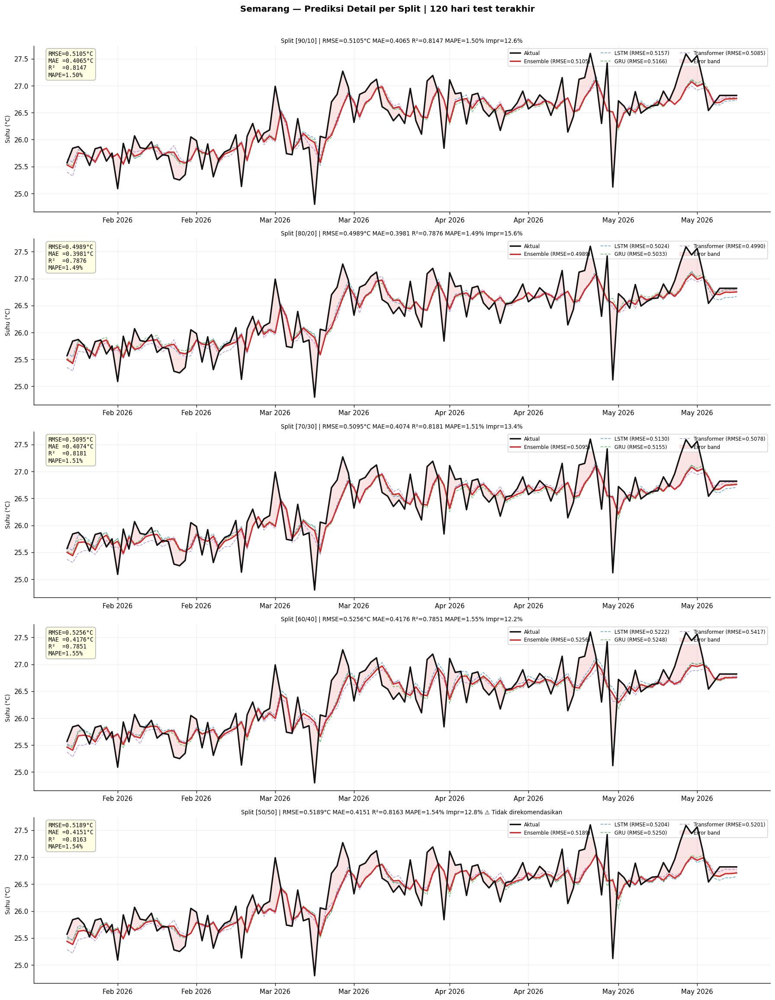

  ✅ result_C_pred_persplit_semarang.png


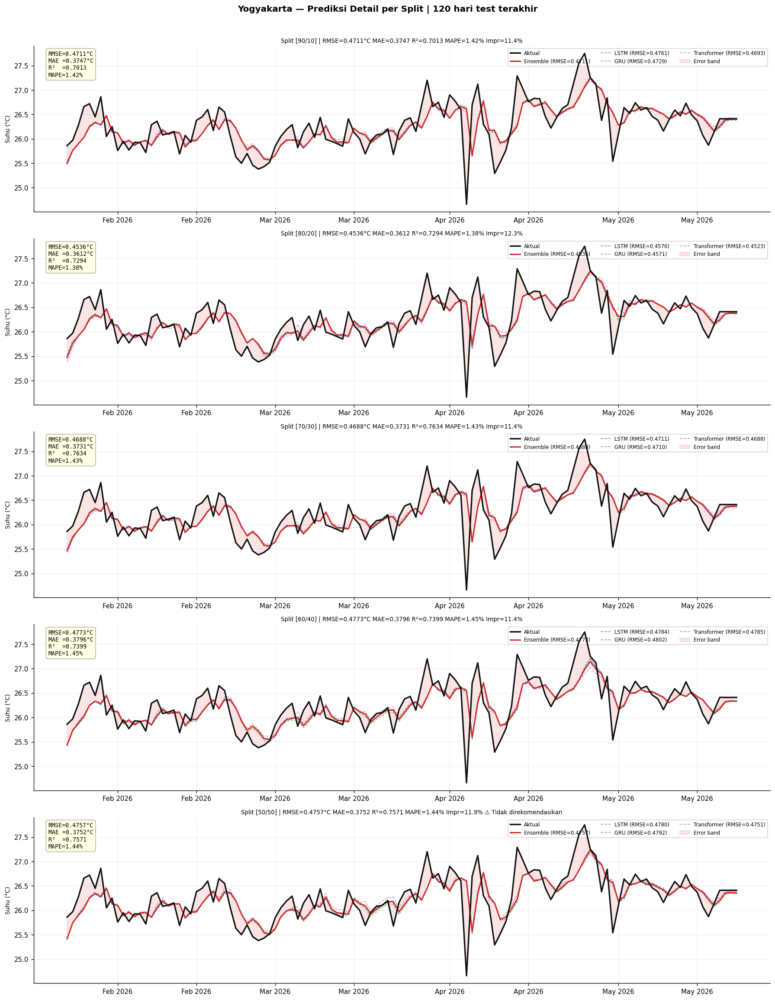

  ✅ result_C_pred_persplit_yogyakarta.png


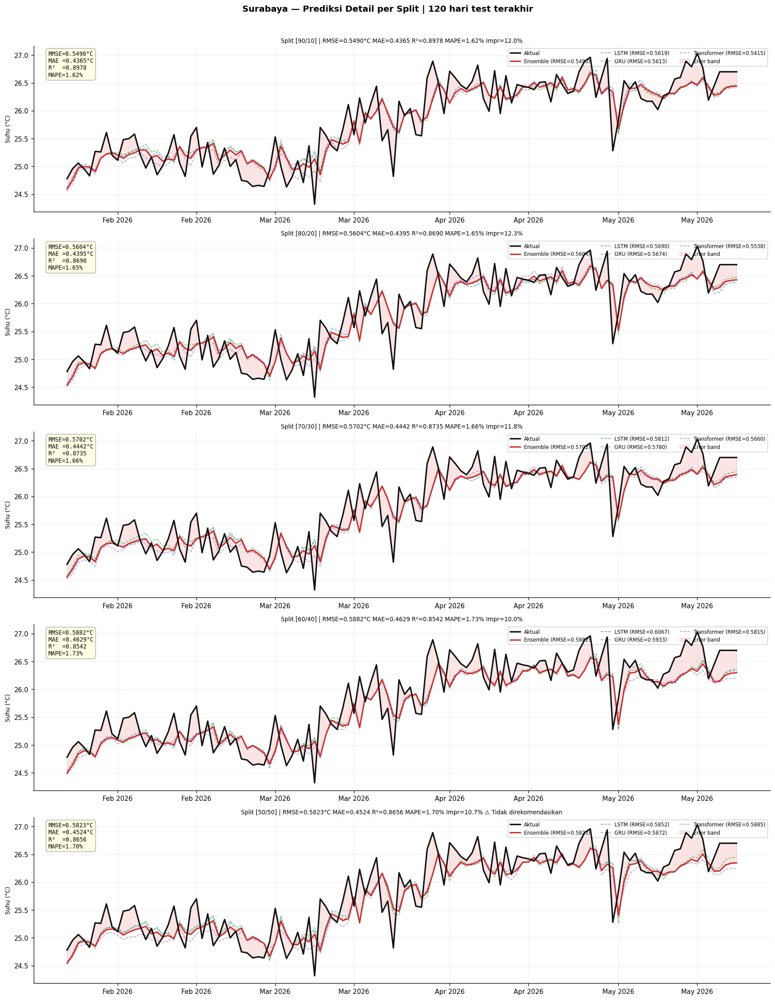

  ✅ result_C_pred_persplit_surabaya.png


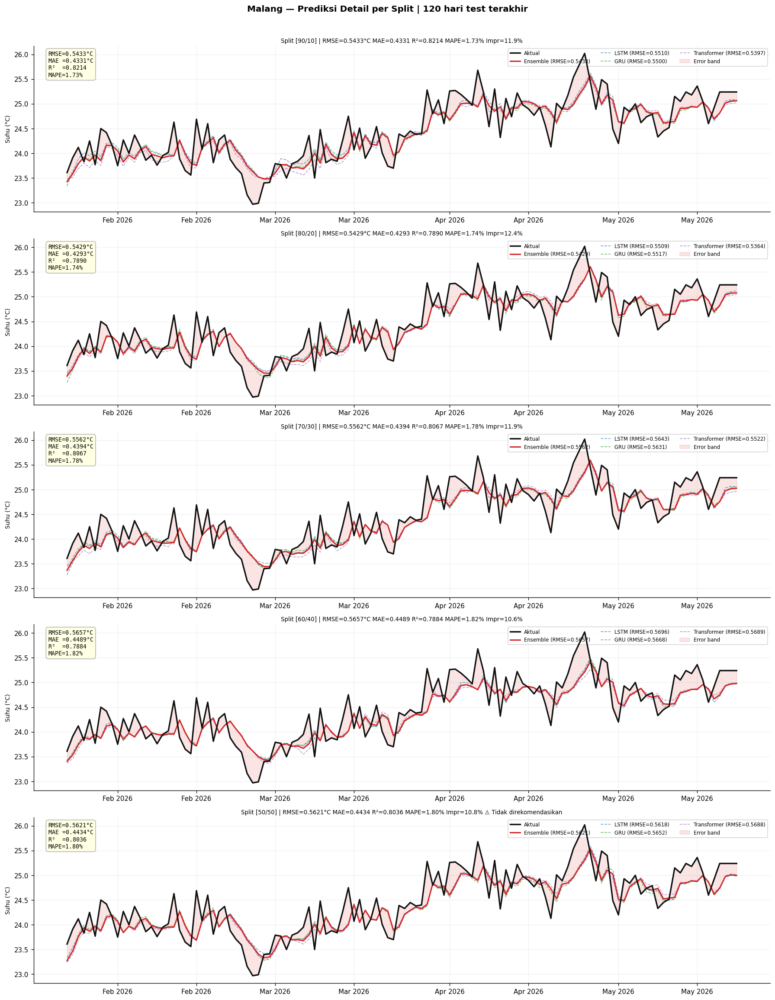

  ✅ result_C_pred_persplit_malang.png

  Membuat Plot D: Residual Analysis...


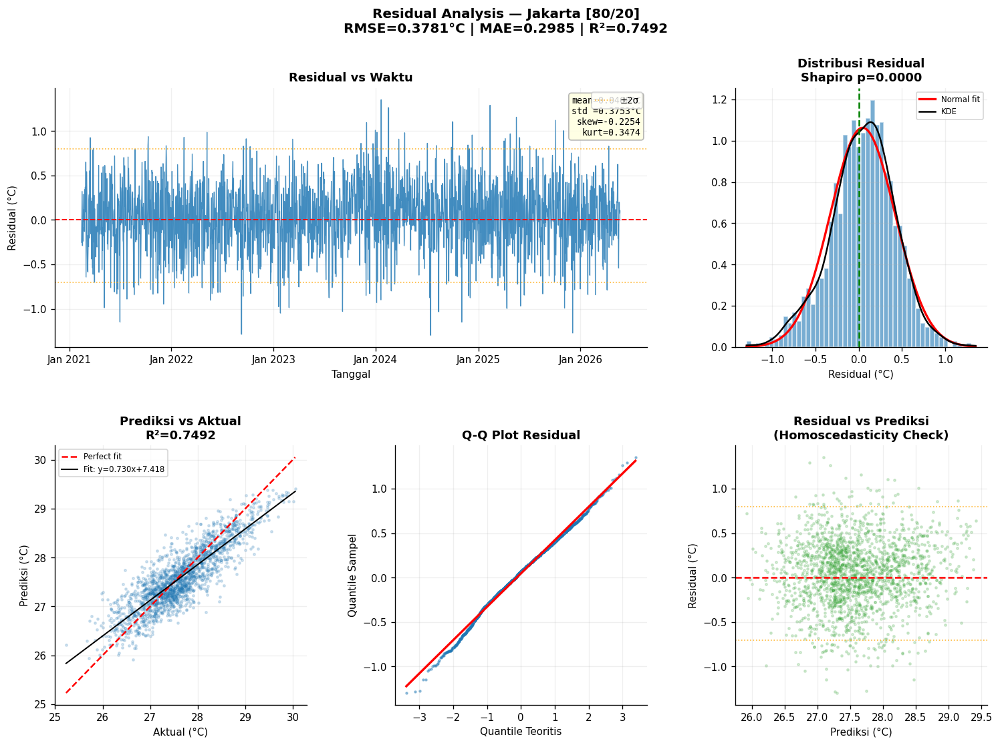

  ✅ result_D_residual_jakarta.png


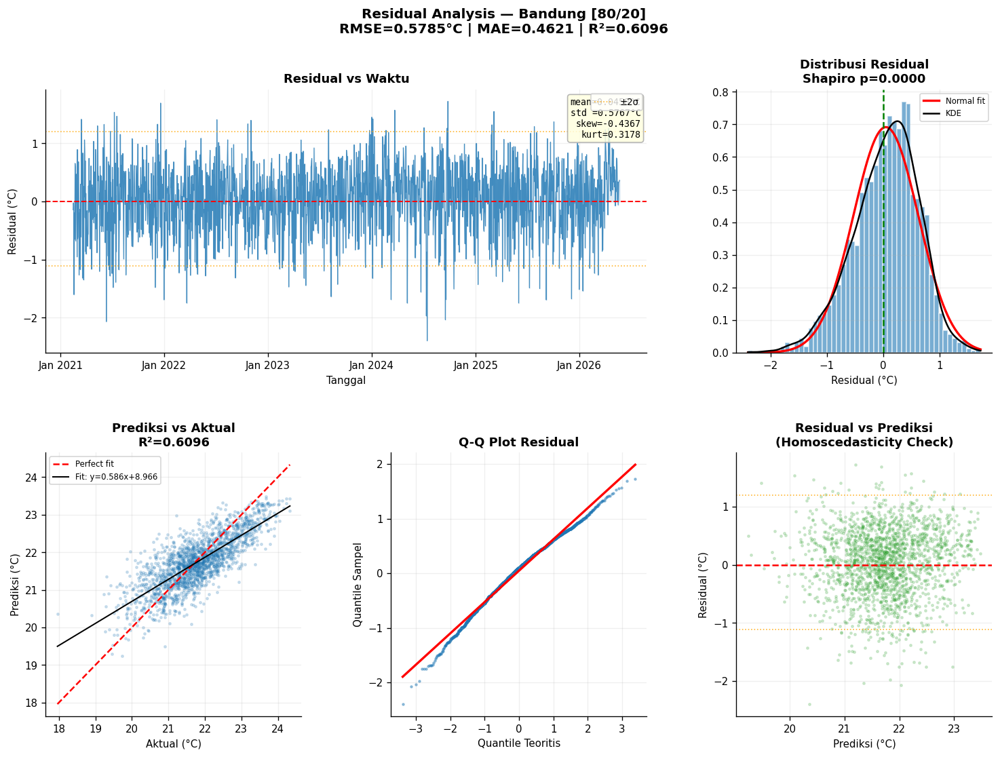

  ✅ result_D_residual_bandung.png


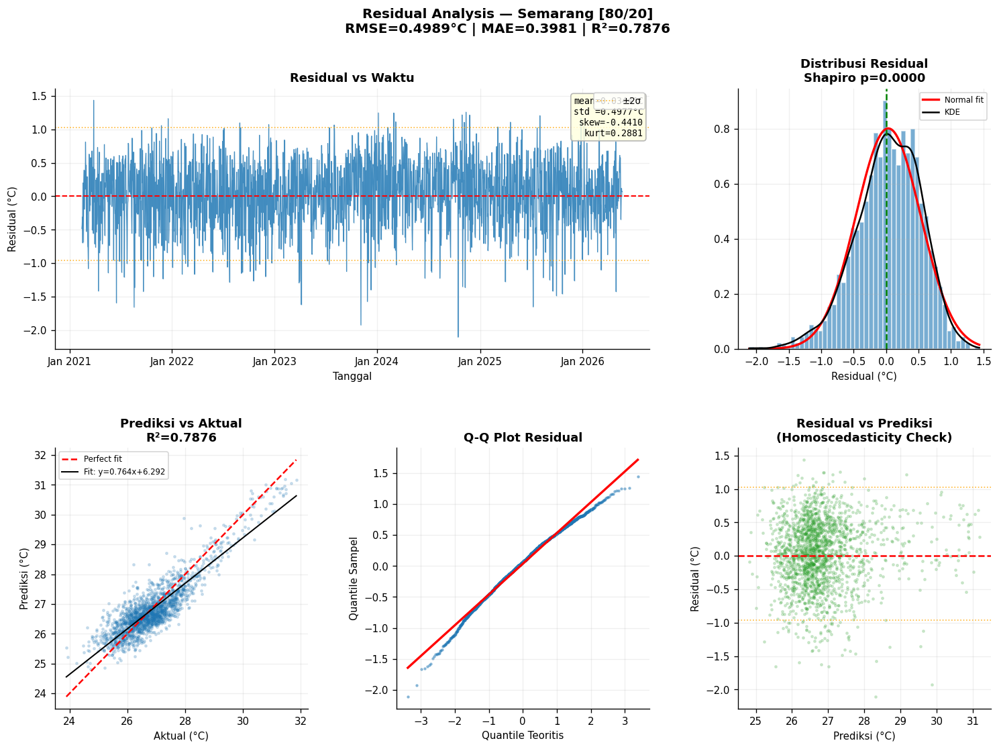

  ✅ result_D_residual_semarang.png


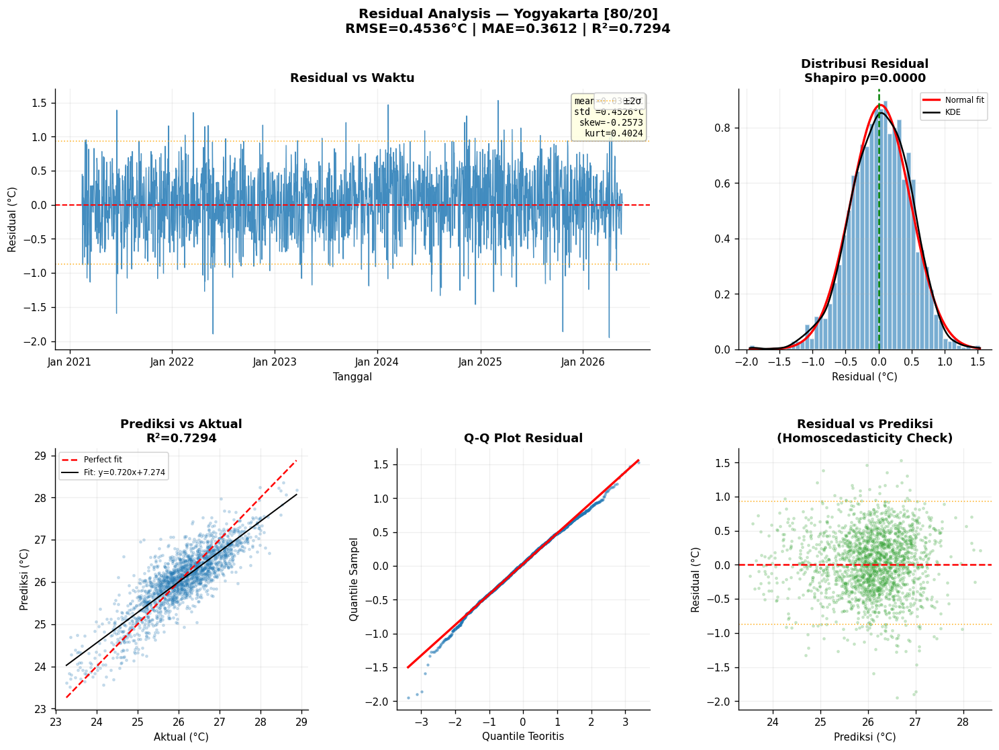

  ✅ result_D_residual_yogyakarta.png


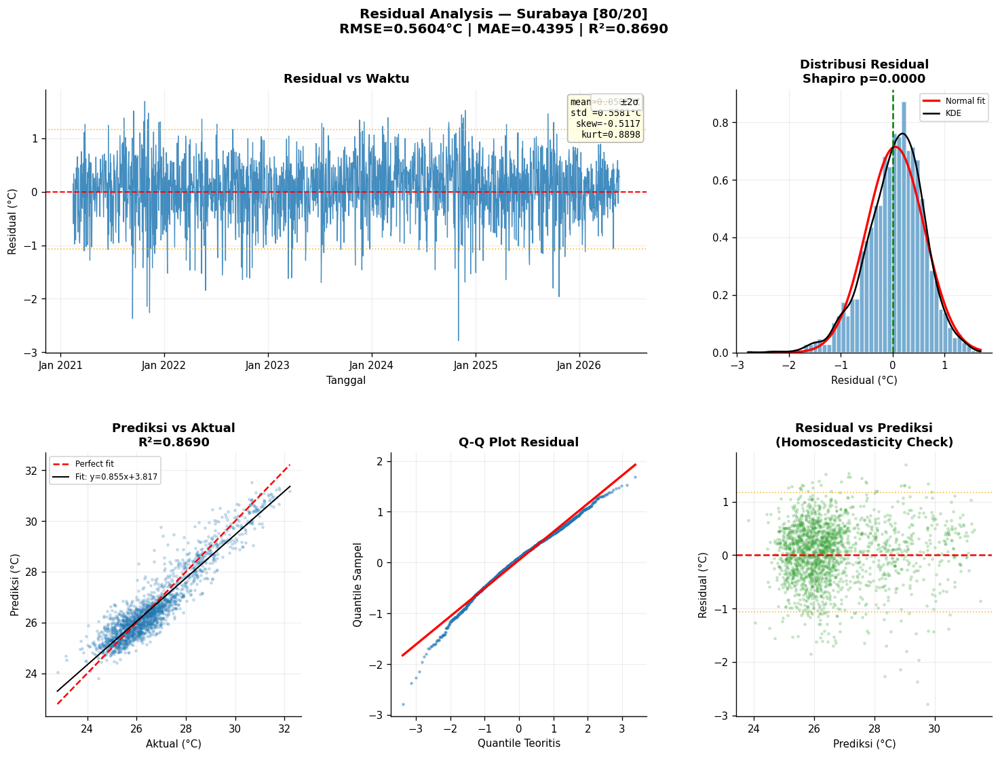

  ✅ result_D_residual_surabaya.png


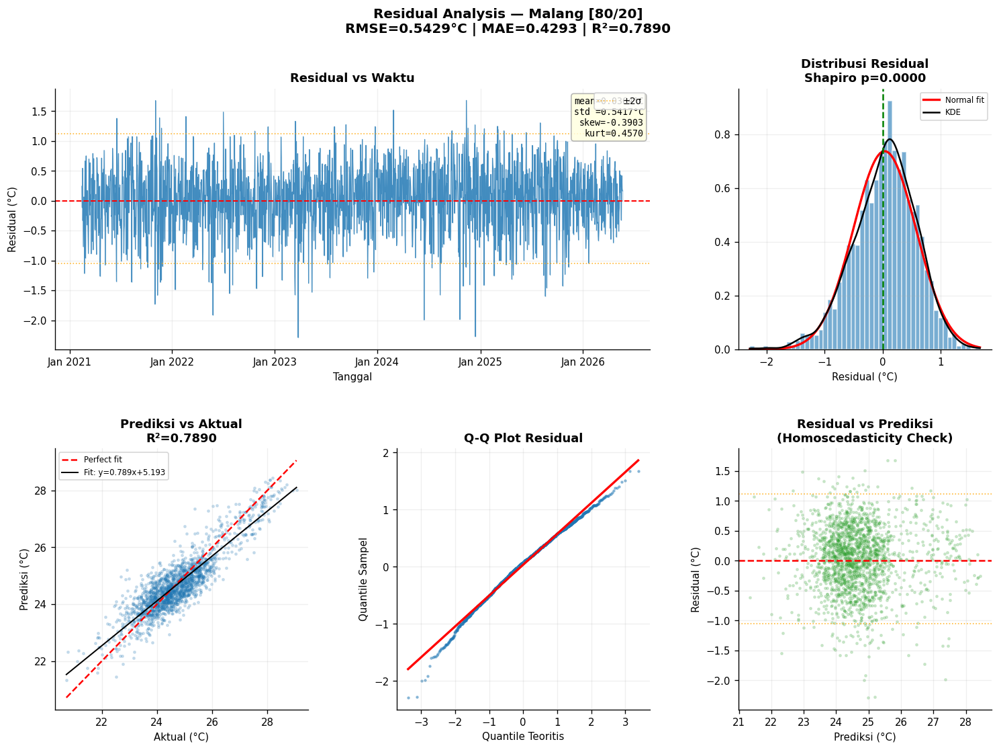

  ✅ result_D_residual_malang.png

  Membuat Plot E: Grouped Bar RMSE per Model...


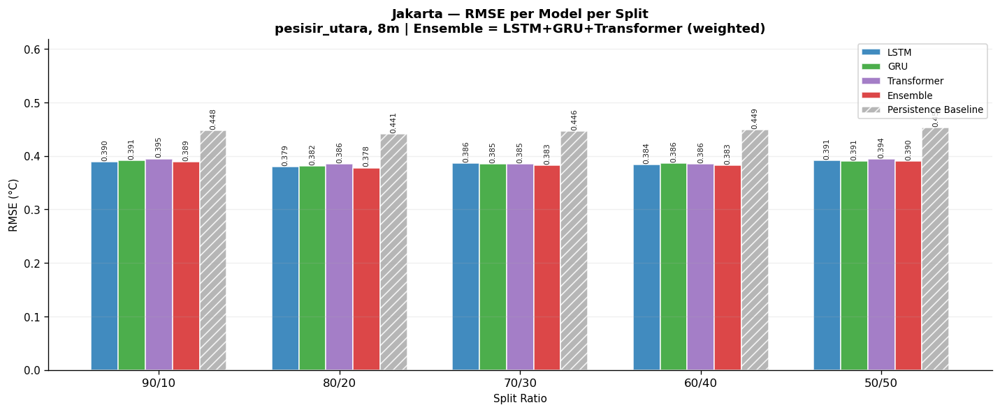

  ✅ result_E_rmse_bar_jakarta.png


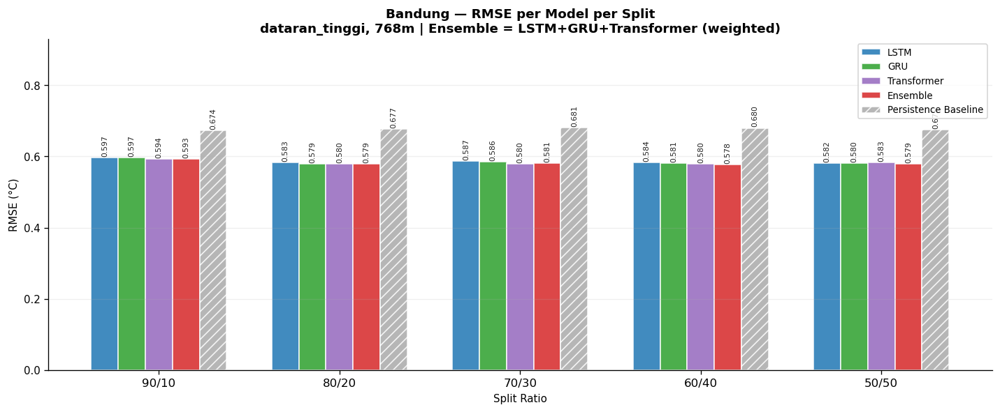

  ✅ result_E_rmse_bar_bandung.png


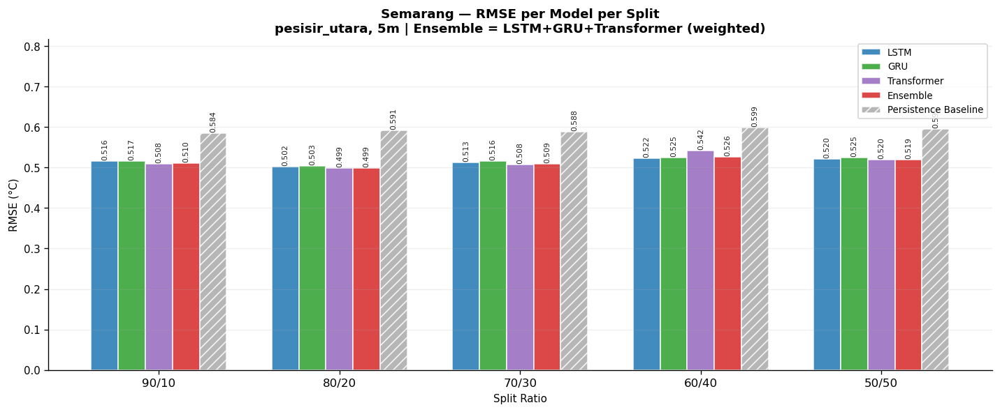

  ✅ result_E_rmse_bar_semarang.png


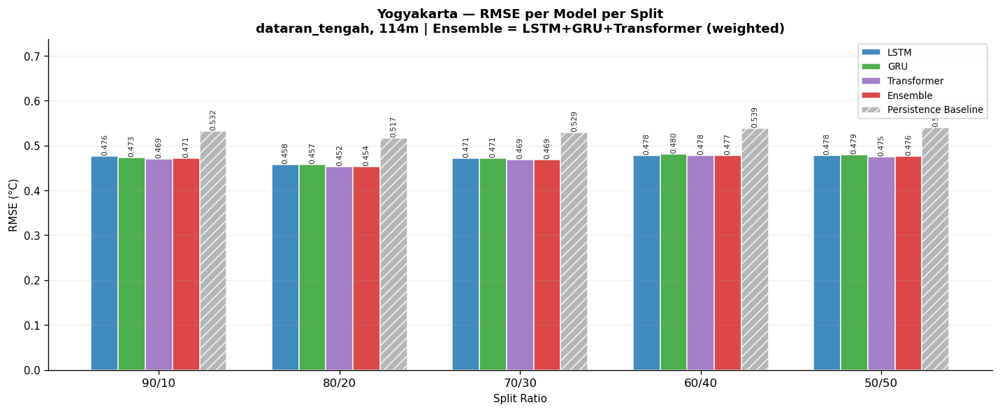

  ✅ result_E_rmse_bar_yogyakarta.png


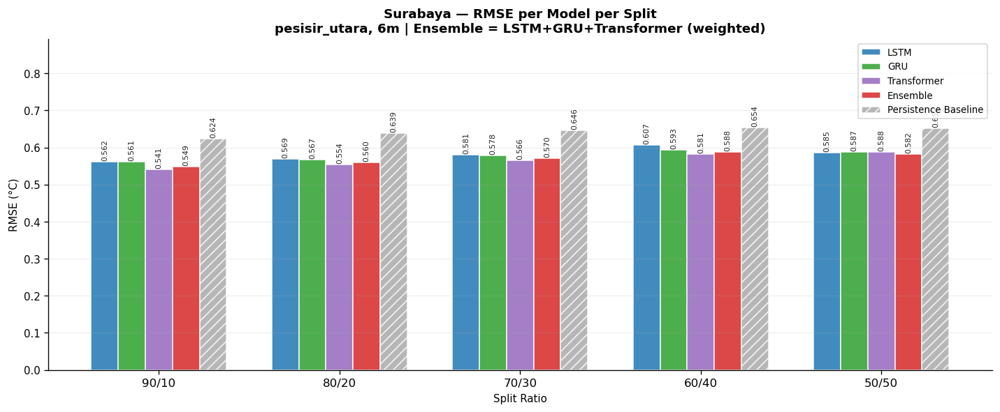

  ✅ result_E_rmse_bar_surabaya.png


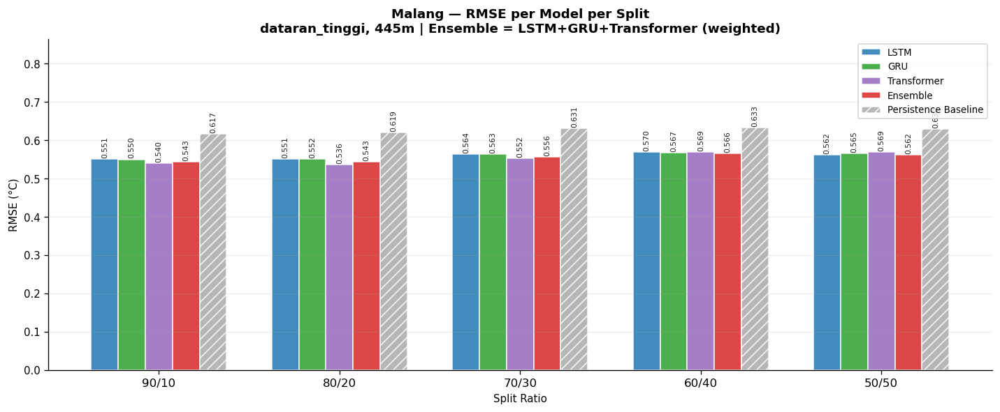

  ✅ result_E_rmse_bar_malang.png

  Membuat Plot F: Heatmap RMSE...


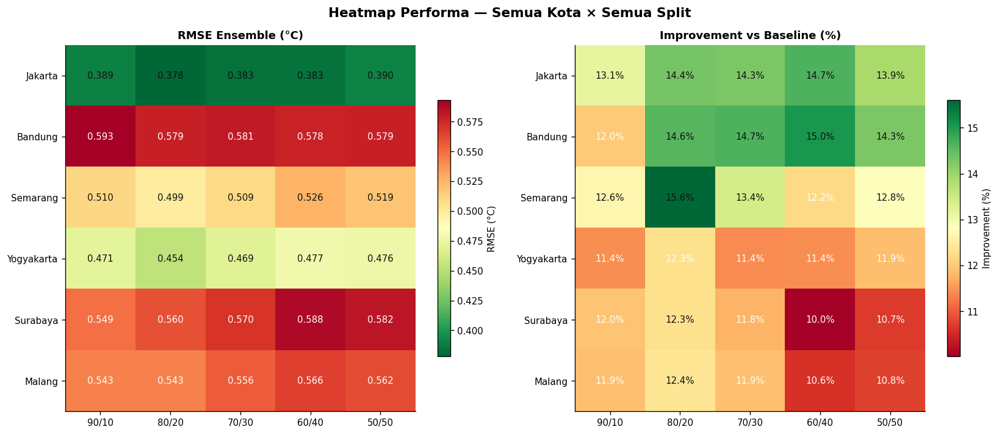

  ✅ result_F_heatmap_global.png

  Membuat Plot G: Ensemble Weights...


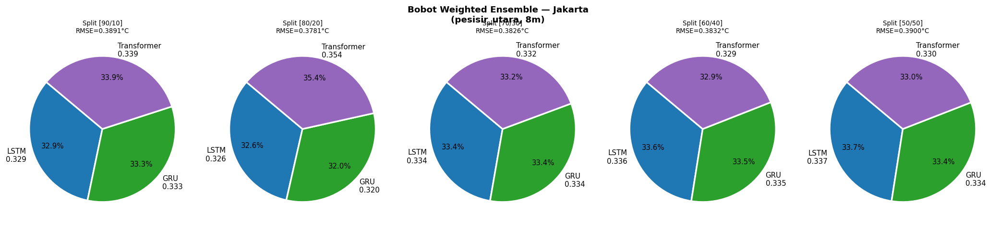

  ✅ result_G_ensemble_weights_jakarta.png


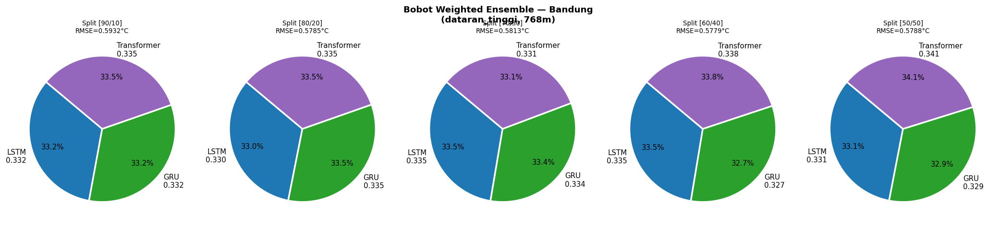

  ✅ result_G_ensemble_weights_bandung.png


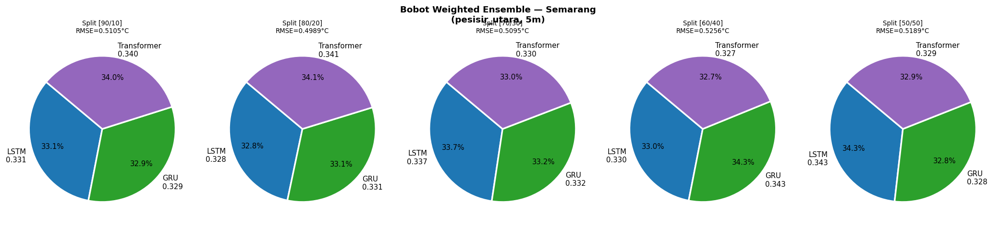

  ✅ result_G_ensemble_weights_semarang.png


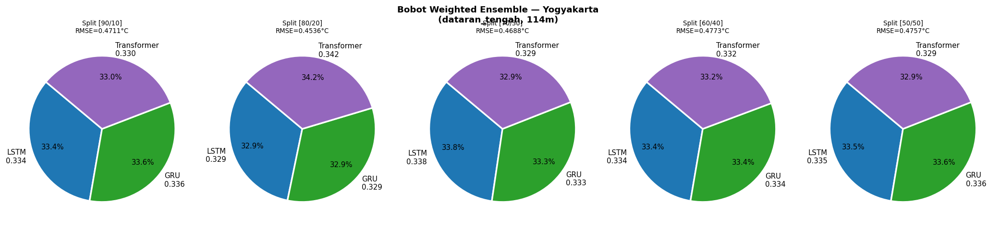

  ✅ result_G_ensemble_weights_yogyakarta.png


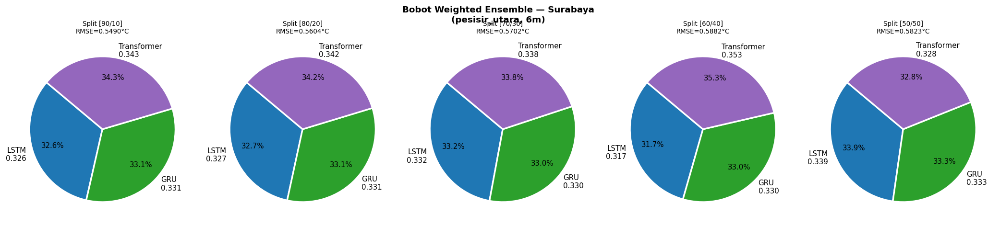

  ✅ result_G_ensemble_weights_surabaya.png


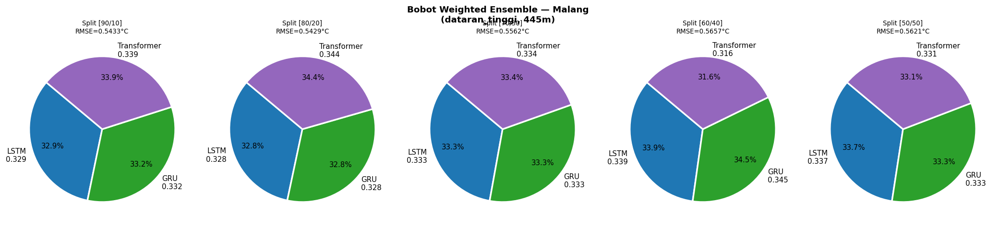

  ✅ result_G_ensemble_weights_malang.png

  Membuat Plot H: Dashboard per Kota...


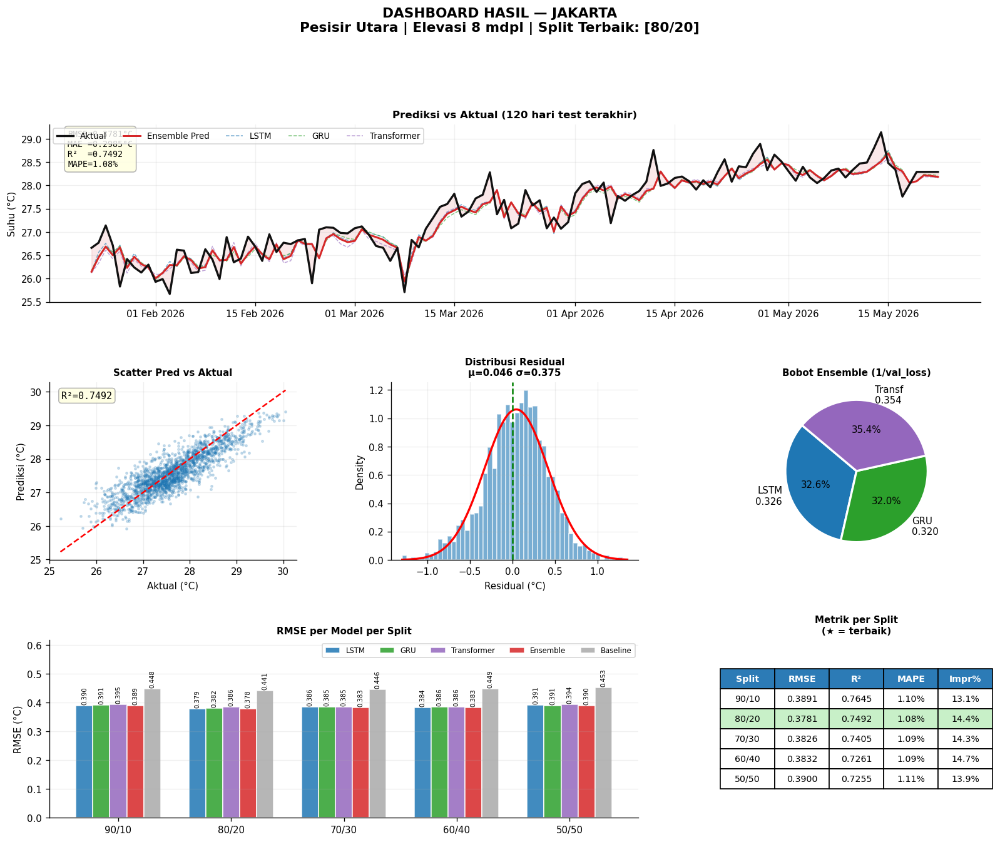

  ✅ result_H_dashboard_jakarta.png


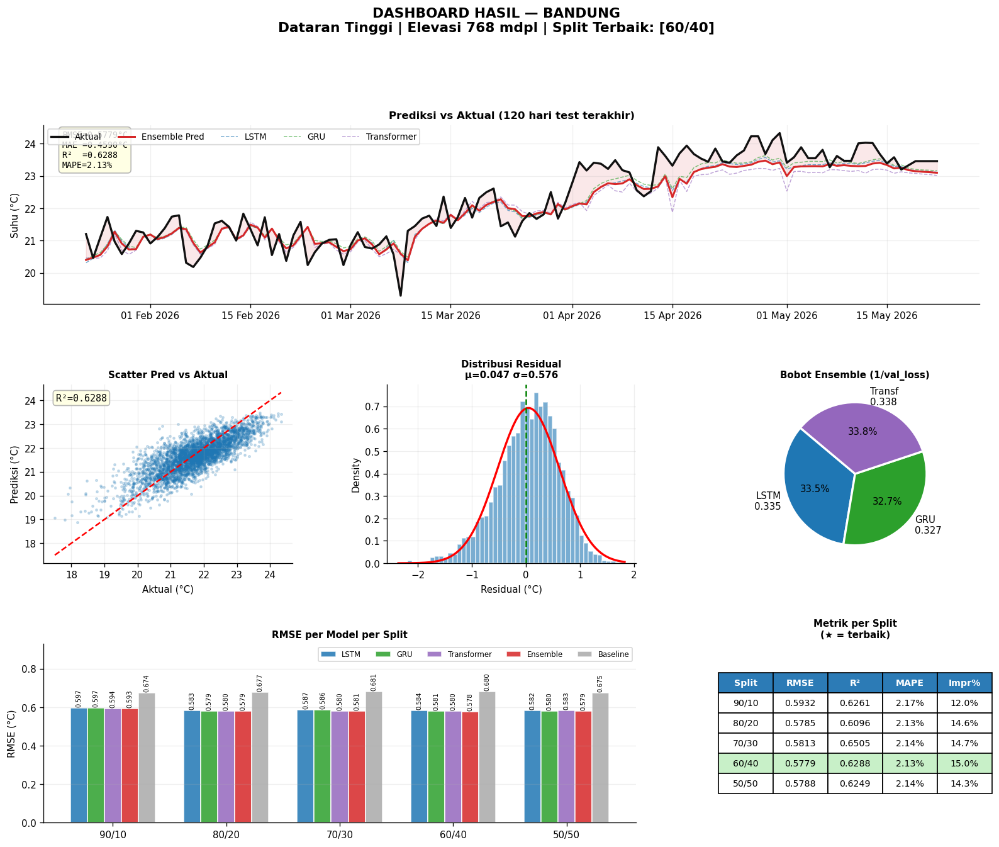

  ✅ result_H_dashboard_bandung.png


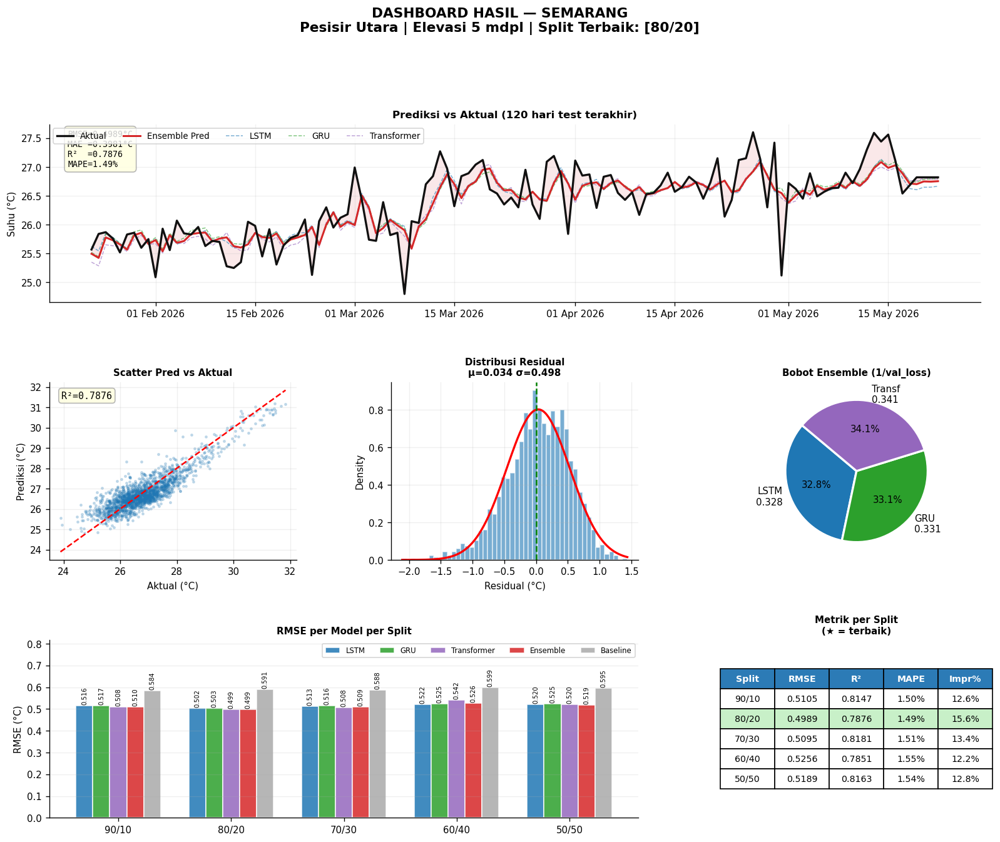

  ✅ result_H_dashboard_semarang.png


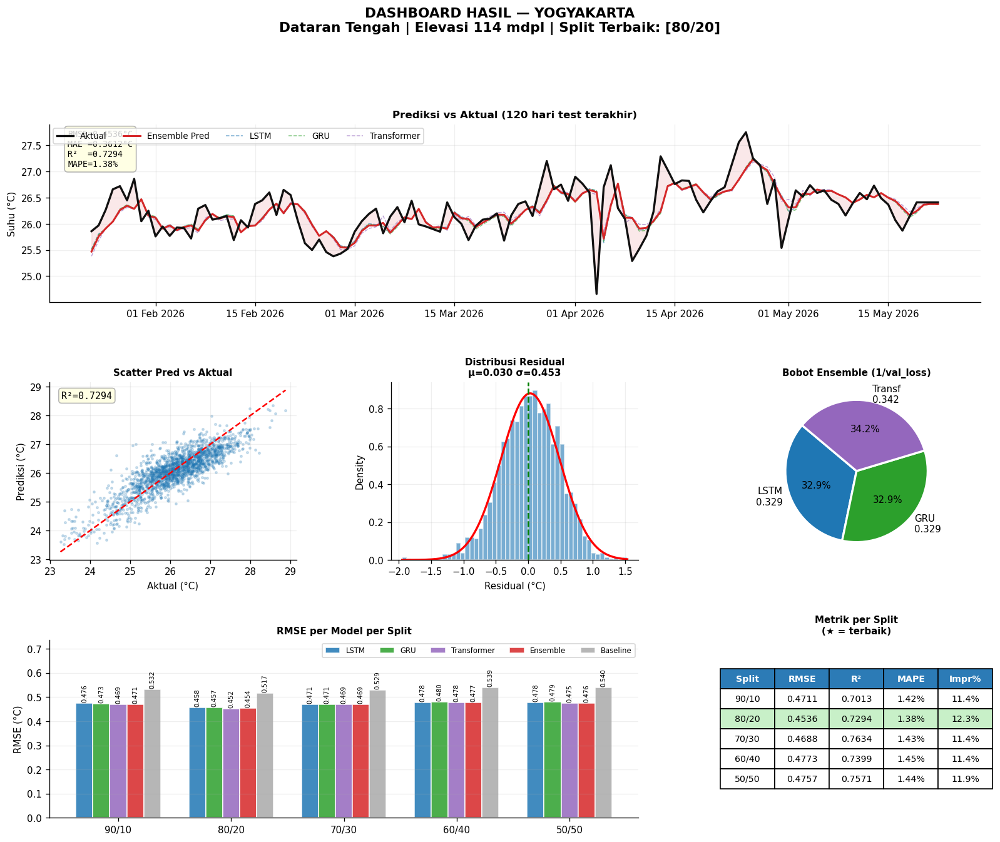

  ✅ result_H_dashboard_yogyakarta.png


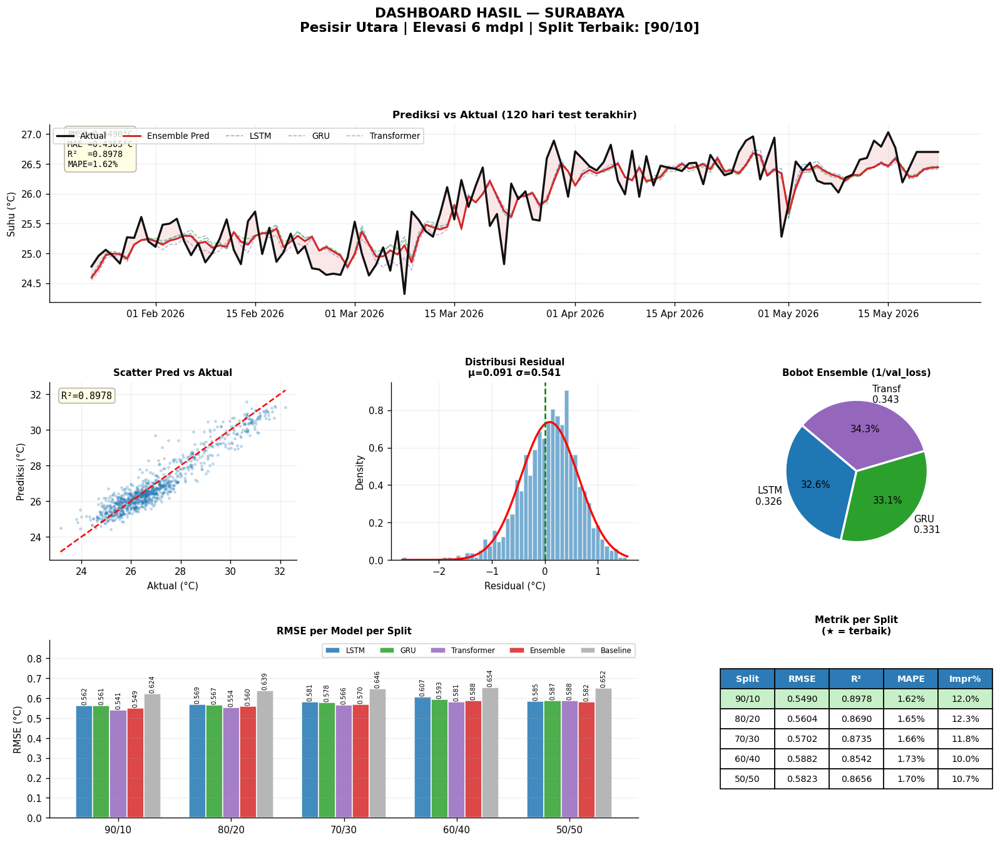

  ✅ result_H_dashboard_surabaya.png


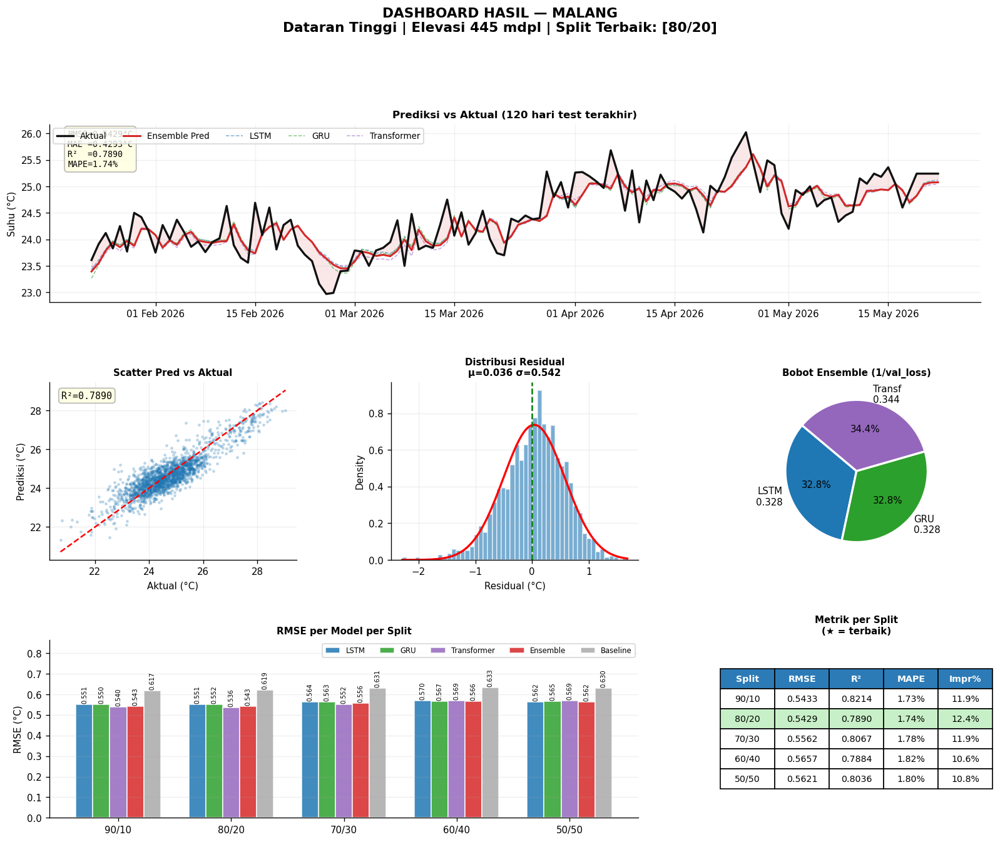

  ✅ result_H_dashboard_malang.png

  Membuat Plot I: Improvement % per Kota...


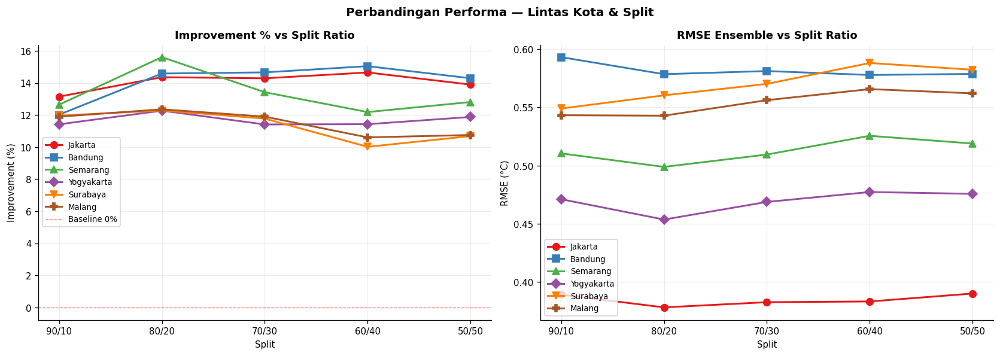

  ✅ result_I_improvement_rmse_trend.png

  ✅ SEMUA VISUALISASI SELESAI
  File output:
    result_A_losscurve_bandung.png
    result_A_losscurve_jakarta.png
    result_A_losscurve_malang.png
    result_A_losscurve_semarang.png
    result_A_losscurve_surabaya.png
    result_A_losscurve_yogyakarta.png
    result_B_pred_overlay_bandung.png
    result_B_pred_overlay_jakarta.png
    result_B_pred_overlay_malang.png
    result_B_pred_overlay_semarang.png
    result_B_pred_overlay_surabaya.png
    result_B_pred_overlay_yogyakarta.png
    result_C_pred_persplit_bandung.png
    result_C_pred_persplit_jakarta.png
    result_C_pred_persplit_malang.png
    result_C_pred_persplit_semarang.png
    result_C_pred_persplit_surabaya.png
    result_C_pred_persplit_yogyakarta.png
    result_D_residual_bandung.png
    result_D_residual_jakarta.png
    result_D_residual_malang.png
    result_D_residual_semarang.png
    result_D_residual_surabaya.png
    result_D_residual_yogyakarta.png
    result_E_rmse_bar_

In [16]:
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
import json

N_SHOW = 120   # jumlah hari test yang ditampilkan di prediksi

# ══════════════════════════════════════════════════════════════════════════════
#  FUNGSI HELPER VISUALISASI
# ══════════════════════════════════════════════════════════════════════════════

def annotate_metrics(ax, rmse, mae, r2, mape=None, x=0.02, y=0.97, fontsize=8):
    """Tampilkan kotak metrik di pojok kiri atas axes."""
    txt = f'RMSE={rmse:.4f}°C\nMAE ={mae:.4f}°C\nR²  ={r2:.4f}'
    if mape is not None:
        txt += f'\nMAPE={mape:.2f}%'
    ax.text(x, y, txt, transform=ax.transAxes, fontsize=fontsize,
            verticalalignment='top', fontfamily='monospace',
            bbox=dict(boxstyle='round,pad=0.4', facecolor='lightyellow',
                      edgecolor='#aaa', alpha=0.85))

def plot_loss_curve(ax, train_losses, val_losses, title=''):
    """Plot learning curve train vs val."""
    ep = range(1, len(train_losses) + 1)
    ax.plot(ep, train_losses, color='#1f77b4', lw=1.2, alpha=0.85, label='Train Loss')
    ax.plot(ep, val_losses,   color='#d62728', lw=1.2, alpha=0.85, label='Val Loss')
    best_ep = int(np.argmin(val_losses)) + 1
    ax.axvline(best_ep, color='green', lw=1, ls='--', alpha=0.7,
               label=f'Best@ep{best_ep}')
    ax.set_xlabel('Epoch', fontsize=8)
    ax.set_ylabel('MSE Loss', fontsize=8)
    ax.set_title(title, fontsize=8, fontweight='bold')
    ax.legend(fontsize=7)
    ax.grid(True, alpha=0.2)


# ══════════════════════════════════════════════════════════════════════════════
#  CEK KETERSEDIAAN DATA (DIAGNOSTIC)
# ══════════════════════════════════════════════════════════════════════════════
print('=' * 70)
print('  DIAGNOSTIC: Cek ketersediaan data kota')
print('=' * 70)
print(f"  Kota di CITIES         : {list(CITIES.keys())}")
print(f"  Kota di city_dataframes: {list(city_dataframes.keys())}")
print(f"  Kota di all_results    : {list(all_results.keys())}")
for city, df in city_dataframes.items():
    splits_ok = list(all_results.get(city, {}).keys())
    print(f"  {city}: {len(df)} baris | splits: {splits_ok}")
print('=' * 70 + '\n')


# ══════════════════════════════════════════════════════════════════════════════
#  PLOT A: LOSS CURVE per Kota per Split (semua model)
# ══════════════════════════════════════════════════════════════════════════════

print('  Membuat Plot A: Val Loss & RMSE per Model per Split...')

for city_name, df_city in city_dataframes.items():
    splits_avail = [lbl for _, _, lbl, _ in SPLIT_CONFIGS
                    if lbl in all_results.get(city_name, {})]
    if not splits_avail:
        print(f'  ⚠️  {city_name}: tidak ada split tersedia, dilewati.')
        continue

    # Baca JSON val loss
    json_path = f'val_loss_{city_name.lower()}.json'
    val_loss_data = {}
    try:
        with open(json_path, 'r') as f:
            val_loss_data = json.load(f)
    except FileNotFoundError:
        print(f'  ⚠️  {json_path} tidak ditemukan.')

    meta   = CITIES[city_name]
    n_sp   = len(splits_avail)
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle(
        f'Val Loss & RMSE per Model per Split — {city_name} '
        f'({meta["zone"]}, {meta["elev"]:.0f}m)',
        fontsize=12, fontweight='bold')

    model_names  = ['LSTM', 'GRU', 'Transformer']
    json_keys    = ['lstm', 'gru', 'tr']
    rmse_keys    = ['rmse_lstm', 'rmse_gru', 'rmse_tr']
    colors       = ['#1f77b4', '#2ca02c', '#9467bd']
    x     = np.arange(len(splits_avail))
    width = 0.25

    # --- Subplot kiri: Val Loss ---
    ax0 = axes[0]
    for i, (mname, jk, clr) in enumerate(zip(model_names, json_keys, colors)):
        vals = []
        for lbl in splits_avail:
            v = val_loss_data.get(lbl, {}).get(jk, np.nan)
            vals.append(v)
        bars = ax0.bar(x + i * width - width, vals, width,
                       label=mname, color=clr, alpha=0.85, edgecolor='white')
        ax0.bar_label(bars, fmt='%.5f', padding=2, fontsize=6.5, rotation=90)
    ax0.set_xticks(x); ax0.set_xticklabels(splits_avail)
    ax0.set_ylabel('Best Val Loss (MSE)')
    ax0.set_xlabel('Split Ratio')
    ax0.set_title('Best Validation Loss per Model', fontweight='bold')
    ax0.legend(fontsize=8); ax0.grid(True, axis='y', alpha=0.2)
    ax0.set_ylim(0, ax0.get_ylim()[1] * 1.35)

    # --- Subplot kanan: RMSE ---
    ax1 = axes[1]
    for i, (mname, rk, clr) in enumerate(zip(model_names, rmse_keys, colors)):
        vals = [all_results[city_name][lbl].get(rk, np.nan)
                for lbl in splits_avail]
        bars = ax1.bar(x + i * width - width, vals, width,
                       label=mname, color=clr, alpha=0.85, edgecolor='white')
        ax1.bar_label(bars, fmt='%.4f', padding=2, fontsize=6.5, rotation=90)
    # Tambahkan Ensemble
    ens_vals = [all_results[city_name][lbl].get('rmse', np.nan)
                for lbl in splits_avail]
    bars_ens = ax1.bar(x + width, ens_vals, width,
                       label='Ensemble', color='#d62728', alpha=0.85,
                       edgecolor='white', hatch='///')
    ax1.bar_label(bars_ens, fmt='%.4f', padding=2, fontsize=6.5, rotation=90)
    ax1.set_xticks(x); ax1.set_xticklabels(splits_avail)
    ax1.set_ylabel('RMSE (°C)')
    ax1.set_xlabel('Split Ratio')
    ax1.set_title('RMSE per Model per Split', fontweight='bold')
    ax1.legend(fontsize=8); ax1.grid(True, axis='y', alpha=0.2)
    ax1.set_ylim(0, ax1.get_ylim()[1] * 1.35)

    plt.tight_layout()
    fname = f'result_A_losscurve_{city_name.lower()}.png'
    plt.savefig(fname, dpi=130, bbox_inches='tight')
    plt.show()
    print(f'  ✅ {fname}')


# ══════════════════════════════════════════════════════════════════════════════
#  PLOT B: PREDIKSI vs AKTUAL OVERLAY semua split (per kota)
# ══════════════════════════════════════════════════════════════════════════════
print('\n  Membuat Plot B: Prediksi vs Aktual Overlay...')

for city_name, df_city in city_dataframes.items():
    splits_avail = [lbl for _, _, lbl, _ in SPLIT_CONFIGS
                    if lbl in all_results.get(city_name, {})]
    if not splits_avail:
        print(f'  ⚠️  {city_name}: tidak ada split tersedia, dilewati.')
        continue

    fig, ax = plt.subplots(figsize=(15, 5))
    actual_plotted = False

    for split_lbl in splits_avail:
        r       = all_results[city_name][split_lbl]
        t_start = r['test_start_df']
        min_len = r['n_test']
        dates   = df_city['DATE'].iloc[t_start:t_start + min_len].values
        n_show  = min(N_SHOW, min_len)
        actual  = r['actual'][:min_len]
        pred    = r['pred'][:min_len]

        if not actual_plotted:
            ax.plot(dates[-n_show:], actual[-n_show:],
                    color='#111', lw=2.2, zorder=10, label='Aktual')
            actual_plotted = True

        clr     = CMAP_SPLIT.get(split_lbl, '#888')
        alp     = 0.4 if split_lbl == '50/50' else 0.85
        rmse    = r['rmse']
        impr    = r['improvement']
        lbl_str = f'{split_lbl} RMSE={rmse:.4f} Impr={impr:.1f}%'
        if split_lbl == '50/50':
            lbl_str += ' ⚠️'
        ax.plot(dates[-n_show:], pred[-n_show:],
                color=clr, lw=1.4, ls='--', alpha=alp, label=lbl_str)

    meta = CITIES[city_name]
    ax.set_title(
        f'{city_name} — Prediksi Ensemble vs Aktual '
        f'({N_SHOW} hari terakhir test masing-masing split)\n'
        f'{meta["zone"].replace("_", " ").title()}, {meta["elev"]:.0f} mdpl',
        fontsize=11, fontweight='bold')
    ax.set_ylabel('Suhu (°C)')
    ax.set_xlabel('Tanggal')
    ax.legend(fontsize=8, loc='upper left', ncol=2)
    ax.grid(True, alpha=0.18)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
    plt.tight_layout()
    fname = f'result_B_pred_overlay_{city_name.lower()}.png'
    plt.savefig(fname, dpi=130, bbox_inches='tight')
    plt.show()
    print(f'  ✅ {fname}')


# ══════════════════════════════════════════════════════════════════════════════
#  PLOT C: SUBPLOT PREDIKSI per SPLIT (per kota)
# ══════════════════════════════════════════════════════════════════════════════
print('\n  Membuat Plot C: Subplot per Split...')

for city_name, df_city in city_dataframes.items():
    splits_avail = [lbl for _, _, lbl, _ in SPLIT_CONFIGS
                    if lbl in all_results.get(city_name, {})]
    if not splits_avail:
        print(f'  ⚠️  {city_name}: tidak ada split tersedia, dilewati.')
        continue

    n_sp = len(splits_avail)
    fig, axes = plt.subplots(n_sp, 1, figsize=(15, 3.8 * n_sp))
    if n_sp == 1:
        axes = [axes]
    meta = CITIES[city_name]
    fig.suptitle(
        f'{city_name} — Prediksi Detail per Split | {N_SHOW} hari test terakhir',
        fontsize=12, fontweight='bold', y=1.01)

    for ax, split_lbl in zip(axes, splits_avail):
        r        = all_results[city_name][split_lbl]
        t_start  = r['test_start_df']
        min_len  = r['n_test']
        dates    = df_city['DATE'].iloc[t_start:t_start + min_len].values
        n_show   = min(N_SHOW, min_len)
        actual   = r['actual'][:min_len]
        pred_ens = r['pred'][:min_len]
        pred_l   = r['pred_lstm'][:min_len]
        pred_g   = r['pred_gru'][:min_len]
        pred_t   = r['pred_tr'][:min_len]
        ds       = dates[-n_show:]

        ax.plot(ds, actual[-n_show:],   color='#111', lw=2,   zorder=10, label='Aktual')
        ax.plot(ds, pred_ens[-n_show:], color='#d62728', lw=1.8, ls='-',
                zorder=9, label=f'Ensemble (RMSE={r["rmse"]:.4f})')
        ax.plot(ds, pred_l[-n_show:],   color='#1f77b4', lw=1, ls='--', alpha=0.65,
                label=f'LSTM (RMSE={r["rmse_lstm"]:.4f})')
        ax.plot(ds, pred_g[-n_show:],   color='#2ca02c', lw=1, ls='--', alpha=0.65,
                label=f'GRU (RMSE={r["rmse_gru"]:.4f})')
        ax.plot(ds, pred_t[-n_show:],   color='#9467bd', lw=1, ls='--', alpha=0.65,
                label=f'Transformer (RMSE={r["rmse_tr"]:.4f})')
        ax.fill_between(ds,
                        actual[-n_show:].flatten(),
                        pred_ens[-n_show:].flatten(),
                        alpha=0.12, color='#d62728', label='Error band')

        warn = ' ⚠️ Tidak direkomendasikan' if split_lbl == '50/50' else ''
        ax.set_title(
            f'Split [{split_lbl}] | RMSE={r["rmse"]:.4f}°C MAE={r["mae"]:.4f} '
            f'R²={r["r2"]:.4f} MAPE={r["mape"]:.2f}% '
            f'Impr={r["improvement"]:.1f}%{warn}',
            fontsize=8, pad=5)
        annotate_metrics(ax, r['rmse'], r['mae'], r['r2'], r['mape'])
        ax.set_ylabel('Suhu (°C)', fontsize=8)
        ax.legend(fontsize=7, loc='upper right', ncol=3)
        ax.grid(True, alpha=0.18)
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

    plt.tight_layout()
    fname = f'result_C_pred_persplit_{city_name.lower()}.png'
    plt.savefig(fname, dpi=130, bbox_inches='tight')
    plt.show()
    print(f'  ✅ {fname}')


# ══════════════════════════════════════════════════════════════════════════════
#  PLOT D: RESIDUAL ANALYSIS per kota (split 80/20 sebagai referensi)
# ══════════════════════════════════════════════════════════════════════════════
print('\n  Membuat Plot D: Residual Analysis...')

REF_SPLIT = '80/20'
for city_name, df_city in city_dataframes.items():
    if REF_SPLIT not in all_results.get(city_name, {}):
        print(f'  ⚠️  {city_name}: split {REF_SPLIT} tidak tersedia, dilewati.')
        continue

    r      = all_results[city_name][REF_SPLIT]
    actual = r['actual'].flatten()
    pred   = r['pred'].flatten()
    resid  = actual - pred
    t_start = r['test_start_df']
    dates   = df_city['DATE'].iloc[t_start:t_start + r['n_test']].values[:len(resid)]

    fig = plt.figure(figsize=(15, 10))
    gs  = gridspec.GridSpec(2, 3, figure=fig, hspace=0.38, wspace=0.35)
    meta = CITIES[city_name]
    fig.suptitle(
        f'Residual Analysis — {city_name} [{REF_SPLIT}]\n'
        f'RMSE={r["rmse"]:.4f}°C | MAE={r["mae"]:.4f} | R²={r["r2"]:.4f}',
        fontsize=12, fontweight='bold')

    # D1: Residual vs Waktu
    ax1 = fig.add_subplot(gs[0, :2])
    ax1.plot(dates, resid, color='#1f77b4', lw=0.7, alpha=0.8)
    ax1.fill_between(dates, resid, 0, alpha=0.15, color='#1f77b4')
    ax1.axhline(0, color='red', lw=1.2, ls='--')
    ax1.axhline(resid.mean() + 2 * resid.std(), color='orange', lw=1, ls=':', alpha=0.8)
    ax1.axhline(resid.mean() - 2 * resid.std(), color='orange', lw=1, ls=':', alpha=0.8,
                label='±2σ')
    ax1.set_title('Residual vs Waktu', fontweight='bold')
    ax1.set_ylabel('Residual (°C)')
    ax1.set_xlabel('Tanggal')
    ax1.legend(fontsize=8)
    ax1.grid(True, alpha=0.18)
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

    # D2: Histogram Residual
    ax2 = fig.add_subplot(gs[0, 2])
    ax2.hist(resid, bins=50, color='#1f77b4', alpha=0.6, density=True, ec='white')
    x_r = np.linspace(resid.min(), resid.max(), 200)
    ax2.plot(x_r, stats.norm.pdf(x_r, resid.mean(), resid.std()),
             'r-', lw=2, label='Normal fit')
    kde_r = gaussian_kde(resid)
    ax2.plot(x_r, kde_r(x_r), 'k-', lw=1.5, label='KDE')
    ax2.axvline(0, color='green', lw=1.5, ls='--')
    _, p_sw = stats.shapiro(resid[:5000])
    ax2.set_title(f'Distribusi Residual\nShapiro p={p_sw:.4f}', fontweight='bold')
    ax2.set_xlabel('Residual (°C)')
    ax2.legend(fontsize=7)
    ax2.grid(True, alpha=0.2)

    # D3: Scatter Prediksi vs Aktual
    ax3 = fig.add_subplot(gs[1, 0])
    ax3.scatter(actual, pred, alpha=0.18, s=4, color='#1f77b4')
    mn = min(actual.min(), pred.min())
    mx = max(actual.max(), pred.max())
    ax3.plot([mn, mx], [mn, mx], 'r--', lw=1.5, label='Perfect fit')
    z = np.polyfit(actual, pred, 1)
    ax3.plot([mn, mx], np.poly1d(z)([mn, mx]), 'k-', lw=1.2,
             label=f'Fit: y={z[0]:.3f}x+{z[1]:.3f}')
    ax3.set_xlabel('Aktual (°C)')
    ax3.set_ylabel('Prediksi (°C)')
    ax3.set_title(f'Prediksi vs Aktual\nR²={r["r2"]:.4f}', fontweight='bold')
    ax3.legend(fontsize=7)
    ax3.grid(True, alpha=0.2)

    # D4: Q-Q Plot
    ax4 = fig.add_subplot(gs[1, 1])
    (osm, osr), (slope, intercept, _) = stats.probplot(resid, dist='norm')
    ax4.scatter(osm, osr, s=3, alpha=0.4, color='#1f77b4')
    ax4.plot([osm[0], osm[-1]],
             [slope * osm[0] + intercept, slope * osm[-1] + intercept],
             'r-', lw=2)
    ax4.set_xlabel('Quantile Teoritis')
    ax4.set_ylabel('Quantile Sampel')
    ax4.set_title('Q-Q Plot Residual', fontweight='bold')
    ax4.grid(True, alpha=0.2)

    # D5: Residual vs Prediksi (homoscedasticity check)
    ax5 = fig.add_subplot(gs[1, 2])
    ax5.scatter(pred, resid, alpha=0.18, s=4, color='#2ca02c')
    ax5.axhline(0, color='red', lw=1.5, ls='--')
    ax5.axhline(resid.mean() + 2 * resid.std(), color='orange', lw=1, ls=':', alpha=0.8)
    ax5.axhline(resid.mean() - 2 * resid.std(), color='orange', lw=1, ls=':', alpha=0.8)
    ax5.set_xlabel('Prediksi (°C)')
    ax5.set_ylabel('Residual (°C)')
    ax5.set_title('Residual vs Prediksi\n(Homoscedasticity Check)', fontweight='bold')
    ax5.grid(True, alpha=0.2)

    # D1 extra info
    ax1.text(0.99, 0.97,
             f'mean={resid.mean():.4f}°C\nstd ={resid.std():.4f}°C\n'
             f'skew={stats.skew(resid):.4f}\nkurt={stats.kurtosis(resid):.4f}',
             transform=ax1.transAxes, fontsize=8, va='top', ha='right',
             fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='lightyellow',
                       edgecolor='#aaa', alpha=0.85))

    fname = f'result_D_residual_{city_name.lower()}.png'
    plt.savefig(fname, dpi=130, bbox_inches='tight')
    plt.show()
    print(f'  ✅ {fname}')


# ══════════════════════════════════════════════════════════════════════════════
#  PLOT E: PERBANDINGAN RMSE per MODEL per SPLIT — grouped bar chart
# ══════════════════════════════════════════════════════════════════════════════
print('\n  Membuat Plot E: Grouped Bar RMSE per Model...')

for city_name in city_dataframes:
    splits_avail = [lbl for _, _, lbl, _ in SPLIT_CONFIGS
                    if lbl in all_results.get(city_name, {})]
    if not splits_avail:
        print(f'  ⚠️  {city_name}: tidak ada split tersedia, dilewati.')
        continue

    fig, ax = plt.subplots(figsize=(12, 5))
    model_keys   = ['rmse_lstm', 'rmse_gru', 'rmse_tr', 'rmse', 'rmse_persist']
    model_names  = ['LSTM', 'GRU', 'Transformer', 'Ensemble', 'Persistence Baseline']
    model_colors = ['#1f77b4', '#2ca02c', '#9467bd', '#d62728', '#aaaaaa']
    model_hatch  = ['', '', '', '', '///']
    x     = np.arange(len(splits_avail))
    width = 0.15

    for i, (mkey, mname, clr, hatch) in enumerate(
            zip(model_keys, model_names, model_colors, model_hatch)):
        vals = [all_results[city_name][lbl].get(mkey, 0) for lbl in splits_avail]
        bars = ax.bar(x + i * width - 2 * width, vals, width,
                      label=mname, color=clr, alpha=0.85, hatch=hatch,
                      edgecolor='white')
        ax.bar_label(bars, fmt='%.3f', padding=1, fontsize=6.5,
                     rotation=90, color='#222')

    ax.set_xticks(x)
    ax.set_xticklabels(splits_avail, fontsize=10)
    ax.set_ylabel('RMSE (°C)')
    ax.set_xlabel('Split Ratio')
    meta = CITIES[city_name]
    ax.set_title(
        f'{city_name} — RMSE per Model per Split\n'
        f'{meta["zone"]}, {meta["elev"]:.0f}m | Ensemble = LSTM+GRU+Transformer (weighted)',
        fontsize=11, fontweight='bold')
    ax.legend(fontsize=8, loc='upper right')
    ax.grid(True, axis='y', alpha=0.2)
    ax.set_ylim(0, ax.get_ylim()[1] * 1.3)
    plt.tight_layout()
    fname = f'result_E_rmse_bar_{city_name.lower()}.png'
    plt.savefig(fname, dpi=130, bbox_inches='tight')
    plt.show()
    print(f'  ✅ {fname}')


# ══════════════════════════════════════════════════════════════════════════════
#  PLOT F: HEATMAP RMSE — semua kota × semua split
# ══════════════════════════════════════════════════════════════════════════════
print('\n  Membuat Plot F: Heatmap RMSE...')

cities_list = [c for c in city_dataframes if all_results.get(c)]
splits_plot = [lbl for _, _, lbl, _ in SPLIT_CONFIGS]

heatmap_data = np.array([
    [all_results[c][lbl]['rmse'] if lbl in all_results.get(c, {}) else np.nan
     for lbl in splits_plot]
    for c in cities_list
])

fig, axes = plt.subplots(1, 2, figsize=(14, max(4, len(cities_list))))

# F1: RMSE Ensemble
im1 = axes[0].imshow(heatmap_data, aspect='auto', cmap='RdYlGn_r',
                     vmin=np.nanmin(heatmap_data), vmax=np.nanmax(heatmap_data))
axes[0].set_xticks(range(len(splits_plot)))
axes[0].set_xticklabels(splits_plot)
axes[0].set_yticks(range(len(cities_list)))
axes[0].set_yticklabels(cities_list)
axes[0].set_title('RMSE Ensemble (°C)', fontweight='bold')
for i in range(len(cities_list)):
    for j in range(len(splits_plot)):
        val = heatmap_data[i, j]
        if not np.isnan(val):
            axes[0].text(j, i, f'{val:.3f}', ha='center', va='center', fontsize=9,
                         color='white' if val > np.nanmedian(heatmap_data) else '#111')
plt.colorbar(im1, ax=axes[0], shrink=0.7, label='RMSE (°C)')

# F2: Improvement %
impr_data = np.array([
    [all_results[c][lbl]['improvement'] if lbl in all_results.get(c, {}) else np.nan
     for lbl in splits_plot]
    for c in cities_list
])
im2 = axes[1].imshow(impr_data, aspect='auto', cmap='RdYlGn',
                     vmin=np.nanmin(impr_data), vmax=np.nanmax(impr_data))
axes[1].set_xticks(range(len(splits_plot)))
axes[1].set_xticklabels(splits_plot)
axes[1].set_yticks(range(len(cities_list)))
axes[1].set_yticklabels(cities_list)
axes[1].set_title('Improvement vs Baseline (%)', fontweight='bold')
for i in range(len(cities_list)):
    for j in range(len(splits_plot)):
        val = impr_data[i, j]
        if not np.isnan(val):
            axes[1].text(j, i, f'{val:.1f}%', ha='center', va='center', fontsize=9,
                         color='white' if val < np.nanmedian(impr_data) else '#111')
plt.colorbar(im2, ax=axes[1], shrink=0.7, label='Improvement (%)')

plt.suptitle('Heatmap Performa — Semua Kota × Semua Split',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('result_F_heatmap_global.png', dpi=130, bbox_inches='tight')
plt.show()
print('  ✅ result_F_heatmap_global.png')


# ══════════════════════════════════════════════════════════════════════════════
#  PLOT G: BOBOT ENSEMBLE — pie chart per kota per split
# ══════════════════════════════════════════════════════════════════════════════
print('\n  Membuat Plot G: Ensemble Weights...')

for city_name in cities_list:
    splits_avail = [lbl for _, _, lbl, _ in SPLIT_CONFIGS
                    if lbl in all_results.get(city_name, {})]
    if not splits_avail:
        print(f'  ⚠️  {city_name}: tidak ada split tersedia, dilewati.')
        continue

    n_sp = len(splits_avail)
    fig, axes = plt.subplots(1, n_sp, figsize=(3.5 * n_sp, 4))
    if n_sp == 1:
        axes = [axes]
    meta = CITIES[city_name]
    fig.suptitle(
        f'Bobot Weighted Ensemble — {city_name}\n'
        f'({meta["zone"]}, {meta["elev"]:.0f}m)',
        fontsize=11, fontweight='bold')

    for ax, split_lbl in zip(axes, splits_avail):
        r  = all_results[city_name][split_lbl]
        ws = [r['w_lstm'], r['w_gru'], r['w_tr']]
        # FIX: gunakan \n (escape) bukan newline literal
        labels = [
            f'LSTM\n{ws[0]:.3f}',
            f'GRU\n{ws[1]:.3f}',
            f'Transformer\n{ws[2]:.3f}'
        ]
        clrs = ['#1f77b4', '#2ca02c', '#9467bd']
        wedges, texts, autotexts = ax.pie(
            ws, labels=labels, colors=clrs, autopct='%1.1f%%',
            startangle=140, pctdistance=0.72,
            wedgeprops=dict(edgecolor='white', linewidth=2))
        for at in autotexts:
            at.set_fontsize(9)
        ax.set_title(f'Split [{split_lbl}]\nRMSE={r["rmse"]:.4f}°C',
                     fontsize=8, pad=6)

    plt.tight_layout()
    fname = f'result_G_ensemble_weights_{city_name.lower()}.png'
    plt.savefig(fname, dpi=130, bbox_inches='tight')
    plt.show()
    print(f'  ✅ {fname}')


# ══════════════════════════════════════════════════════════════════════════════
#  PLOT H: DASHBOARD RINGKASAN TIAP KOTA (1 halaman per kota)
# ══════════════════════════════════════════════════════════════════════════════
print('\n  Membuat Plot H: Dashboard per Kota...')

for city_name, df_city in city_dataframes.items():
    # Pilih split terbaik (RMSE terendah, non-50/50)
    avail = {lbl: all_results[city_name][lbl]['rmse']
             for _, _, lbl, _ in SPLIT_CONFIGS
             if lbl in all_results.get(city_name, {}) and lbl != '50/50'}
    if not avail:
        print(f'  ⚠️  {city_name}: tidak ada split valid untuk dashboard, dilewati.')
        continue

    best_lbl = min(avail, key=avail.get)
    r        = all_results[city_name][best_lbl]
    meta     = CITIES[city_name]
    actual   = r['actual'].flatten()
    pred_ens = r['pred'].flatten()
    resid    = actual - pred_ens
    t_start  = r['test_start_df']
    min_len  = r['n_test']
    dates    = df_city['DATE'].iloc[t_start:t_start + min_len].values[:len(actual)]

    fig = plt.figure(figsize=(16, 12))
    gs  = gridspec.GridSpec(3, 3, figure=fig, hspace=0.45, wspace=0.38)
    fig.suptitle(
        f'DASHBOARD HASIL — {city_name.upper()}\n'
        f'{meta["zone"].replace("_", " ").title()} | Elevasi {meta["elev"]:.0f} mdpl | '
        f'Split Terbaik: [{best_lbl}]',
        fontsize=13, fontweight='bold', y=1.01)

    # H1: Time series (full test)
    ax1 = fig.add_subplot(gs[0, :])
    n_show_h = min(N_SHOW, len(actual))
    ds       = dates[-n_show_h:]
    ax1.plot(ds, actual[-n_show_h:],   color='#111', lw=2,   label='Aktual', zorder=10)
    ax1.plot(ds, pred_ens[-n_show_h:], color='#d62728', lw=1.8, label='Ensemble Pred', zorder=9)
    ax1.plot(ds, r['pred_lstm'][:min_len][-n_show_h:], color='#1f77b4',
             lw=0.9, ls='--', alpha=0.6, label='LSTM')
    ax1.plot(ds, r['pred_gru'][:min_len][-n_show_h:],  color='#2ca02c',
             lw=0.9, ls='--', alpha=0.6, label='GRU')
    ax1.plot(ds, r['pred_tr'][:min_len][-n_show_h:],   color='#9467bd',
             lw=0.9, ls='--', alpha=0.6, label='Transformer')
    ax1.fill_between(ds, actual[-n_show_h:], pred_ens[-n_show_h:],
                     alpha=0.1, color='#d62728')
    annotate_metrics(ax1, r['rmse'], r['mae'], r['r2'], r['mape'])
    ax1.set_title(f'Prediksi vs Aktual ({n_show_h} hari test terakhir)',
                  fontweight='bold', fontsize=10)
    ax1.set_ylabel('Suhu (°C)')
    ax1.legend(fontsize=8, ncol=5, loc='upper left')
    ax1.grid(True, alpha=0.18)
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%d %b %Y'))

    # H2: Scatter plot
    ax2 = fig.add_subplot(gs[1, 0])
    ax2.scatter(actual, pred_ens, alpha=0.2, s=4, color='#1f77b4')
    mn = min(actual.min(), pred_ens.min())
    mx = max(actual.max(), pred_ens.max())
    ax2.plot([mn, mx], [mn, mx], 'r--', lw=1.5)
    ax2.set_xlabel('Aktual (°C)')
    ax2.set_ylabel('Prediksi (°C)')
    ax2.set_title('Scatter Pred vs Aktual', fontweight='bold', fontsize=9)
    ax2.grid(True, alpha=0.2)
    ax2.text(0.05, 0.95, f'R²={r["r2"]:.4f}', transform=ax2.transAxes,
             fontsize=9, va='top', fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='lightyellow',
                       edgecolor='#aaa', alpha=0.85))

    # H3: Histogram residual
    ax3 = fig.add_subplot(gs[1, 1])
    ax3.hist(resid, bins=50, color='#1f77b4', alpha=0.6, density=True, ec='white')
    x_r = np.linspace(resid.min(), resid.max(), 200)
    ax3.plot(x_r, stats.norm.pdf(x_r, resid.mean(), resid.std()), 'r-', lw=2)
    ax3.axvline(0, color='green', lw=1.5, ls='--')
    ax3.set_xlabel('Residual (°C)')
    ax3.set_ylabel('Density')
    ax3.set_title(
        f'Distribusi Residual\nμ={resid.mean():.3f} σ={resid.std():.3f}',
        fontweight='bold', fontsize=9)
    ax3.grid(True, alpha=0.2)

    # H4: Bobot ensemble (FIX: \n bukan newline literal)
    ax4 = fig.add_subplot(gs[1, 2])
    ws       = [r['w_lstm'], r['w_gru'], r['w_tr']]
    clrs_pie = ['#1f77b4', '#2ca02c', '#9467bd']
    wlabels  = [
        f'LSTM\n{ws[0]:.3f}',
        f'GRU\n{ws[1]:.3f}',
        f'Transf\n{ws[2]:.3f}'
    ]
    ax4.pie(ws, labels=wlabels, colors=clrs_pie, autopct='%1.1f%%',
            startangle=140, wedgeprops=dict(edgecolor='white', lw=2))
    ax4.set_title('Bobot Ensemble (1/val_loss)', fontweight='bold', fontsize=9)

    # H5: RMSE per model per split
    ax5 = fig.add_subplot(gs[2, :2])
    splits_for_bar = [lbl for _, _, lbl, _ in SPLIT_CONFIGS
                      if lbl in all_results.get(city_name, {})]
    mkeys_bar   = ['rmse_lstm', 'rmse_gru', 'rmse_tr', 'rmse', 'rmse_persist']
    mnames_bar  = ['LSTM', 'GRU', 'Transformer', 'Ensemble', 'Baseline']
    mcolors_bar = ['#1f77b4', '#2ca02c', '#9467bd', '#d62728', '#aaaaaa']
    x_b = np.arange(len(splits_for_bar))
    w_b = 0.15
    for i, (mk, mn, mc) in enumerate(zip(mkeys_bar, mnames_bar, mcolors_bar)):
        vals = [all_results[city_name][lbl].get(mk, 0) for lbl in splits_for_bar]
        bars = ax5.bar(x_b + i * w_b - 2 * w_b, vals, w_b,
                       label=mn, color=mc, alpha=0.85, edgecolor='white')
        ax5.bar_label(bars, fmt='%.3f', padding=1, fontsize=6, rotation=90)
    ax5.set_xticks(x_b)
    ax5.set_xticklabels(splits_for_bar)
    ax5.set_ylabel('RMSE (°C)')
    ax5.set_title('RMSE per Model per Split', fontweight='bold', fontsize=9)
    ax5.legend(fontsize=7, ncol=5)
    ax5.grid(True, axis='y', alpha=0.2)
    ax5.set_ylim(0, ax5.get_ylim()[1] * 1.3)

    # H6: Tabel metrik ringkas
    ax6 = fig.add_subplot(gs[2, 2])
    ax6.axis('off')
    table_data = []
    for _, _, lbl, _ in SPLIT_CONFIGS:
        if lbl not in all_results.get(city_name, {}):
            continue
        rv = all_results[city_name][lbl]
        table_data.append([lbl,
                           f'{rv["rmse"]:.4f}',
                           f'{rv["r2"]:.4f}',
                           f'{rv["mape"]:.2f}%',
                           f'{rv["improvement"]:.1f}%'])
    if table_data:
        col_labels = ['Split', 'RMSE', 'R²', 'MAPE', 'Impr%']
        tbl = ax6.table(cellText=table_data, colLabels=col_labels,
                        loc='center', cellLoc='center')
        tbl.auto_set_font_size(False)
        tbl.set_fontsize(8.5)
        tbl.scale(1.1, 1.6)
        for j in range(len(col_labels)):
            tbl[(0, j)].set_facecolor('#2c7bb6')
            tbl[(0, j)].set_text_props(color='white', fontweight='bold')
        best_row = min(range(len(table_data)),
                       key=lambda i: float(table_data[i][1]))
        for j in range(len(col_labels)):
            tbl[(best_row + 1, j)].set_facecolor('#c8f0c8')
        ax6.set_title('Metrik per Split\n(★ = terbaik)', fontweight='bold', fontsize=9)

    fname = f'result_H_dashboard_{city_name.lower()}.png'
    plt.savefig(fname, dpi=130, bbox_inches='tight')
    plt.show()
    print(f'  ✅ {fname}')


# ══════════════════════════════════════════════════════════════════════════════
#  PLOT I: IMPROVEMENT % per kota vs split ratio (line chart)
# ══════════════════════════════════════════════════════════════════════════════
print('\n  Membuat Plot I: Improvement % per Kota...')

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
markers = ['o', 's', '^', 'D', 'v', 'P']

for i, city_name in enumerate(cities_list):
    xs, ys_impr, ys_rmse = [], [], []
    for _, _, lbl, _ in SPLIT_CONFIGS:
        if lbl in all_results.get(city_name, {}):
            xs.append(lbl)
            ys_impr.append(all_results[city_name][lbl]['improvement'])
            ys_rmse.append(all_results[city_name][lbl]['rmse'])
    if not xs:
        continue
    clr = CITY_COLORS.get(city_name, '#333')
    m   = markers[i % len(markers)]
    axes[0].plot(xs, ys_impr, marker=m, lw=1.8, ms=7, color=clr, label=city_name)
    axes[1].plot(xs, ys_rmse, marker=m, lw=1.8, ms=7, color=clr, label=city_name)

# FIX: gunakan keyword argument color= pada axhline
axes[0].axhline(0, color='red', lw=0.8, ls='--', alpha=0.5, label='Baseline 0%')
axes[0].set_title('Improvement % vs Split Ratio', fontweight='bold')
axes[0].set_ylabel('Improvement (%)')
axes[0].set_xlabel('Split')
axes[0].legend(fontsize=8)
axes[0].grid(True, alpha=0.22)

axes[1].set_title('RMSE Ensemble vs Split Ratio', fontweight='bold')
axes[1].set_ylabel('RMSE (°C)')
axes[1].set_xlabel('Split')
axes[1].legend(fontsize=8)
axes[1].grid(True, alpha=0.22)

plt.suptitle('Perbandingan Performa — Lintas Kota & Split',
             fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig('result_I_improvement_rmse_trend.png', dpi=130, bbox_inches='tight')
plt.show()
print('  ✅ result_I_improvement_rmse_trend.png')


# ──────────────────────────────────────────────────────────────────────────────
print('\n' + '=' * 70)
print('  ✅ SEMUA VISUALISASI SELESAI')
print('=' * 70)
print('  File output:')
for pattern in [
    'result_A_losscurve_*.png',
    'result_B_pred_overlay_*.png',
    'result_C_pred_persplit_*.png',
    'result_D_residual_*.png',
    'result_E_rmse_bar_*.png',
    'result_G_ensemble_weights_*.png',
    'result_H_dashboard_*.png'
]:
    found = glob.glob(pattern)
    for f in sorted(found):
        print(f'    {f}')
for f in ['result_F_heatmap_global.png', 'result_I_improvement_rmse_trend.png']:
    if os.path.exists(f):
        print(f'    {f}')

## Cell 15 — Ringkasan Total Pengujian

In [17]:
SEP = '='*80

print(SEP)
print('  RINGKASAN TOTAL — PREDIKSI SUHU MULTI-KOTA JAWA (Enhanced v3)')
print(SEP)

total_rows = sum(len(df) for df in city_dataframes.values())
df_sample  = list(city_dataframes.values())[0]
period_s   = df_sample['DATE'].min().strftime('%d %b %Y')
period_e   = df_sample['DATE'].max().strftime('%d %b %Y')

print(f'\n  [1] DATASET')
print(f'  Sumber       : NASA POWER Daily Meteorology API')
print(f'  Periode      : {period_s} → {period_e}')
print(f'  Kota         : {list(city_dataframes.keys())}')
print(f'  Total baris  : {total_rows:,}  (avg {total_rows//len(city_dataframes):,}/kota)')
print(f'  Fitur input  : {len(BASE_FEATURES)} — {BASE_FEATURES}')

print(f'\n  [2] ARSITEKTUR')
n_l = sum(p.numel() for p in BigLSTM(len(BASE_FEATURES)).parameters())
n_g = sum(p.numel() for p in BigGRU(len(BASE_FEATURES)).parameters())
n_t = sum(p.numel() for p in WeatherTransformer(len(BASE_FEATURES)).parameters())
print(f'  BigLSTM     : 3 layer × hidden=128, dropout=0.3  → {n_l:,} param')
print(f'  BigGRU      : 3 layer × hidden=128, dropout=0.3  → {n_g:,} param')
print(f'  Transformer : d_model=64, nhead=4, 2 layer       → {n_t:,} param')
print(f'  Ensemble    : Weighted (w ∝ 1/val_loss, dinormalisasi)')
n_models = len(city_dataframes)*len(SPLIT_CONFIGS)*3
print(f'  Total model : {n_models} ({len(city_dataframes)} kota × {len(SPLIT_CONFIGS)} split × 3)')

print(f'\n  [3] EDA')
eda_files = ['eda_01_timeseries.png','eda_02_boxplot_violin.png',
             'eda_03_musiman.png','eda_04_korelasi.png',
             'eda_05_distribusi.png','eda_06_scatter.png',
             'eda_07_outlier_tren.png']
for f in eda_files:
    status = '✅' if os.path.exists(f) else '❌ (belum dibuat)'
    print(f'  {status} {f}')

print(f'\n  [4] HASIL METRIK PER SPLIT')
print(f'  {"Split":>6}  {"RMSE":>8} {"MAE":>8} {"R²":>7} {"MAPE%":>7} {"Impr%":>7}  Catatan')
print('  '+'-'*72)
for _,_,split_lbl,note in SPLIT_CONFIGS:
    rl,ml,r2l,mp,il = [],[],[],[],[]
    for city in city_dataframes:
        if split_lbl in all_results[city]:
            rv = all_results[city][split_lbl]
            rl.append(rv['rmse']); ml.append(rv['mae'])
            r2l.append(rv['r2']); mp.append(rv['mape'])
            il.append(rv['improvement'])
    if not rl: continue
    warn = ' ⚠️ (tidak direkomendasikan)' if split_lbl=='50/50' else ''
    print(f'  {split_lbl:>6}  {np.mean(rl):>8.4f} {np.mean(ml):>8.4f} '
          f'{np.mean(r2l):>7.4f} {np.mean(mp):>7.2f}% {np.mean(il):>7.1f}%{warn}')

print(f'\n  [5] SPLIT TERBAIK PER KOTA')
print(f'  {"Kota":<12} {"Split":>6} {"RMSE":>8} {"R²":>7} {"Impr%":>7}')
print('  '+'-'*50)
for city in city_dataframes:
    cand = {lbl:all_results[city][lbl]
            for _,_,lbl,_ in SPLIT_CONFIGS
            if lbl!='50/50' and lbl in all_results[city]}
    if not cand: continue
    bst = min(cand, key=lambda k: cand[k]['rmse'])
    rv  = cand[bst]
    print(f'  {city:<12} {bst:>6} {rv["rmse"]:>8.4f} {rv["r2"]:>7.4f} {rv["improvement"]:>7.1f}%')

print(f'\n  [6] CATATAN METODOLOGI')
notes = [
    'Scaler fit HANYA di train split — mencegah data leakage',
    'Split kronologis (tidak di-shuffle)',
    'Val set dari dalam train (inner 10%)',
    'Checkpoint lama dihapus sebelum training baru',
    'Val-loss disimpan ke JSON → bobot ensemble asli bisa dipulihkan saat Recovery',
    'Persistence baseline: T-1 langsung dari DataFrame asli',
    f'Reproducibility: SEED={SEED}, cudnn.deterministic=True',
    'EDA dilakukan sebelum modeling (Cell 5, 5B, 5C)',
    'Training per kota dipisah ke cell mandiri (Cell 7–12)',
    'Visualisasi lengkap dari .pt & hasil training (Cell 14)',
    'Split 50/50 hanya untuk kelengkapan akademis',
]
for note in notes: print(f'  ✅ {note}')

print(f'\n  [7] FILE OUTPUT')
output_patterns = [
    'data_kota/*.csv','val_loss_*.json','hasil_multi_split.csv',
    'best_*.pt','eda_*.png','result_*.png'
]
for pat in output_patterns:
    found = glob.glob(pat)
    print(f'  {pat:<35} ({len(found)} file)')

print(f'\n{SEP}')
print('  ✅ SELESAI — Alhamdulillah')
print(SEP)


  RINGKASAN TOTAL — PREDIKSI SUHU MULTI-KOTA JAWA (Enhanced v3)

  [1] DATASET
  Sumber       : NASA POWER Daily Meteorology API
  Periode      : 10 Jan 2000 → 22 May 2026
  Kota         : ['Jakarta', 'Bandung', 'Semarang', 'Yogyakarta', 'Surabaya', 'Malang']
  Total baris  : 57,780  (avg 9,630/kota)
  Fitur input  : 12 — ['TEMPERATURE', 'PRECIPITATION', 'HUMIDITY', 'WIND_SPEED', 'month_sin', 'month_cos', 'day_sin', 'day_cos', 'TEMP_LAG1', 'TEMP_LAG3', 'TEMP_LAG7', 'TEMP_ROLL7']

  [2] ARSITEKTUR
  BigLSTM     : 3 layer × hidden=128, dropout=0.3  → 341,057 param
  BigGRU      : 3 layer × hidden=128, dropout=0.3  → 256,833 param
  Transformer : d_model=64, nhead=4, 2 layer       → 102,913 param
  Ensemble    : Weighted (w ∝ 1/val_loss, dinormalisasi)
  Total model : 90 (6 kota × 5 split × 3)

  [3] EDA
  ✅ eda_01_timeseries.png
  ✅ eda_02_boxplot_violin.png
  ✅ eda_03_musiman.png
  ✅ eda_04_korelasi.png
  ✅ eda_05_distribusi.png
  ✅ eda_06_scatter.png
  ✅ eda_07_outlier_tren.png

  [4] 

## Cell Recovery — Load Ulang dari Checkpoint `.pt`

> Jalankan Cell 1 → Cell 2 → Cell 4 → Cell 6 terlebih dahulu,
> kemudian jalankan cell ini untuk memuat semua model dari `.pt`
> dan membangun kembali `all_results`. Bobot ensemble menggunakan
> val-loss asli dari file `.json` (bukan equal weight).

In [11]:
# ════════════════════════════════════════════════════════════════
#  RECOVERY — Load ulang semua dari disk
# ════════════════════════════════════════════════════════════════
print('='*65); print('  RECOVERY'); print('='*65)

# Load CSV
city_dataframes = {}; city_csv_paths = {}
for city_name in CITIES:
    path = CSV_DIR / f'{city_name.lower()}.csv'
    if path.exists():
        df = pd.read_csv(path, parse_dates=['DATE'])
        city_dataframes[city_name] = df; city_csv_paths[city_name] = path
        print(f'  ✅ {city_name}: {len(df):,} baris')
    else: print(f'  ❌ {city_name}: CSV tidak ditemukan')

all_results = {city: {} for city in city_dataframes}
INPUT_DIM   = len(BASE_FEATURES)

for city_name, df_city in city_dataframes.items():
    vl_path = f'val_loss_{city_name.lower()}.json'
    vl_log  = json.load(open(vl_path)) if os.path.exists(vl_path) else {}

    for train_ratio, _, split_lbl, split_note in SPLIT_CONFIGS:
        safe   = split_lbl.replace('/','_')
        ck_l   = f'best_{city_name.lower()}_{safe}_biglstm.pt'
        ck_g   = f'best_{city_name.lower()}_{safe}_biggru.pt'
        ck_t   = f'best_{city_name.lower()}_{safe}_transformer.pt'
        if not all(os.path.exists(p) for p in [ck_l, ck_g, ck_t]): continue

        n = len(df_city); n_train = int(train_ratio*n)
        train_df = df_city.iloc[:n_train]
        sc_x = MinMaxScaler(); sc_x.fit(train_df[BASE_FEATURES])
        sc_y = MinMaxScaler(); sc_y.fit(train_df[['TEMPERATURE']])
        data_sc   = sc_x.transform(df_city[BASE_FEATURES])
        target_sc = sc_y.transform(df_city[['TEMPERATURE']])
        X_seq, y_seq = create_sequences(data_sc, target_sc, WINDOW)
        seq_split    = int(train_ratio * len(X_seq))
        X_te = X_seq[seq_split:]; y_te = y_seq[seq_split:]

        m_lstm = BigLSTM(INPUT_DIM).to(DEVICE)
        m_lstm.load_state_dict(torch.load(ck_l, map_location=DEVICE))
        m_gru  = BigGRU(INPUT_DIM).to(DEVICE)
        m_gru.load_state_dict(torch.load(ck_g, map_location=DEVICE))
        m_tr   = WeatherTransformer(INPUT_DIM).to(DEVICE)
        m_tr.load_state_dict(torch.load(ck_t, map_location=DEVICE))

        actual = sc_y.inverse_transform(y_te)
        p_lstm = get_preds(m_lstm, X_te, sc_y)
        p_gru  = get_preds(m_gru,  X_te, sc_y)
        p_tr   = get_preds(m_tr,   X_te, sc_y)

        if split_lbl in vl_log:
            va = np.array([vl_log[split_lbl]['lstm'],
                           vl_log[split_lbl]['gru'],
                           vl_log[split_lbl]['tr']])
            w = (1/va) / (1/va).sum()
        else: w = np.array([1/3,1/3,1/3])

        p_ens = w[0]*p_lstm + w[1]*p_gru + w[2]*p_tr
        t_start = seq_split + WINDOW
        n_test  = len(actual)
        persist = df_city['TEMPERATURE'].iloc[
            t_start-1:t_start-1+n_test].values.reshape(-1,1)
        min_len = min(len(persist), n_test)
        actual  = actual[:min_len]; p_ens = p_ens[:min_len]
        persist = persist[:min_len]
        p_lstm, p_gru, p_tr = p_lstm[:min_len], p_gru[:min_len], p_tr[:min_len]

        rmse_p,_,_,_          = compute_metrics(actual, persist)
        rmse_e,mae_e,r2_e,mp  = compute_metrics(actual, p_ens)
        rmse_l,_,r2_l,_       = compute_metrics(actual, p_lstm)
        rmse_g,_,r2_g,_       = compute_metrics(actual, p_gru)
        rmse_t,_,r2_t,_       = compute_metrics(actual, p_tr)
        impr = (rmse_p-rmse_e)/rmse_p*100

        all_results[city_name][split_lbl] = dict(
            rmse=rmse_e, mae=mae_e, r2=r2_e, mape=mp,
            rmse_persist=rmse_p, improvement=impr,
            rmse_lstm=rmse_l, rmse_gru=rmse_g, rmse_tr=rmse_t,
            r2_lstm=r2_l, r2_gru=r2_g, r2_tr=r2_t,
            w_lstm=float(w[0]), w_gru=float(w[1]), w_tr=float(w[2]),
            actual=actual, pred=p_ens, persist=persist,
            pred_lstm=p_lstm, pred_gru=p_gru, pred_tr=p_tr,
            train_losses_lstm=[], val_losses_lstm=[],
            train_losses_gru=[],  val_losses_gru=[],
            train_losses_tr=[],   val_losses_tr=[],
            split_lbl=split_lbl, split_note=split_note,
            n_train=seq_split, n_val=0, n_test=min_len,
            test_start_df=t_start,
        )
        print(f'  ✅ {city_name} [{split_lbl}] RMSE={rmse_e:.4f} R²={r2_e:.4f} '
              f'w={"asli" if split_lbl in vl_log else "equal"}')

print('\n🎉 Recovery selesai! Lanjutkan ke Cell 13, 14, atau 15.')


  RECOVERY
  ✅ Jakarta: 9,630 baris
  ✅ Bandung: 9,630 baris
  ✅ Semarang: 9,630 baris
  ✅ Yogyakarta: 9,630 baris
  ✅ Surabaya: 9,630 baris
  ✅ Malang: 9,630 baris
  ✅ Jakarta [90/10] RMSE=0.3891 R²=0.7645 w=asli
  ✅ Jakarta [80/20] RMSE=0.3781 R²=0.7492 w=asli
  ✅ Jakarta [70/30] RMSE=0.3826 R²=0.7405 w=asli
  ✅ Jakarta [60/40] RMSE=0.3832 R²=0.7261 w=asli
  ✅ Jakarta [50/50] RMSE=0.3900 R²=0.7255 w=asli
  ✅ Bandung [90/10] RMSE=0.5932 R²=0.6261 w=asli
  ✅ Bandung [80/20] RMSE=0.5785 R²=0.6096 w=asli
  ✅ Bandung [70/30] RMSE=0.5813 R²=0.6505 w=asli
  ✅ Bandung [60/40] RMSE=0.5779 R²=0.6288 w=asli
  ✅ Bandung [50/50] RMSE=0.5788 R²=0.6249 w=asli
  ✅ Semarang [90/10] RMSE=0.5105 R²=0.8147 w=asli
  ✅ Semarang [80/20] RMSE=0.4989 R²=0.7876 w=asli
  ✅ Semarang [70/30] RMSE=0.5095 R²=0.8181 w=asli
  ✅ Semarang [60/40] RMSE=0.5256 R²=0.7851 w=asli
  ✅ Semarang [50/50] RMSE=0.5189 R²=0.8163 w=asli
  ✅ Yogyakarta [90/10] RMSE=0.4711 R²=0.7013 w=asli
  ✅ Yogyakarta [80/20] RMSE=0.4536 R²=0.729